In [1]:
"""──────────────────────────────────────────────────────────────────────────┐
│ Loading necessary libraries to build and train model                       │
└──────────────────────────────────────────────────────────────────────────"""
import warnings
warnings.filterwarnings("ignore", category=UserWarning)
import os,sys,gc
import numpy as np
import pickle
import torch
import proplot as plot
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
import pandas as pd
import seaborn as sns
import glob

sys.path.insert(1, '/work/FAC/FGSE/IDYST/tbeucler/default/freddy0218/TCGphy/2020_TC_CRF/dev/freddy0218/scikit/')
from tools import derive_var,read_and_proc
from tools.mlr import mlr
#from tools.preprocess import preproc_maria,preproc_haiyan
sys.path.insert(1, '../')
import read_stuff as read
import ts_models
import properscoring as ps
from copy import deepcopy
#import benchmark
%matplotlib inline
plot.rc.update({'figure.facecolor':'w','axes.labelweight':'ultralight',
                'tick.labelweight':'ultralight','gridminor.linestyle':'--','title.weight':'normal','linewidth':0.5})

In [2]:
import random
def setup_seed(seed):
    random.seed(seed)
    np.random.seed(seed)                       
    torch.manual_seed(seed)                    
    torch.cuda.manual_seed(seed)               
    torch.cuda.manual_seed_all(seed)           
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True
setup_seed(8888)

In [3]:
from tqdm.auto import tqdm
path = '/work/FAC/FGSE/IDYST/tbeucler/default/freddy0218/'
suffix = '_smooth_preproc_dict1b_g'
a = [read_and_proc.depickle(path+'TCGphy/2020_TC_CRF/dev/freddy0218/testML/output/haiyan/processed/uvwheat/'+'mem'+str(lime)+suffix)['u'].shape for lime in tqdm(range(1,21))]
# divide experiments reference
divider = np.asarray([aobj[0] for aobj in a]).cumsum()
del a
gc.collect()

  0%|          | 0/20 [00:00<?, ?it/s]

16007

In [4]:
def prepare_tensors(filepath='./haiyan_store',splitnum=None,explag=23,notensor='No'):
    if './haiyan_store' in filepath:
        Xtrain = read_and_proc.depickle(glob.glob(filepath+'/X/'+str(splitnum)+'/*intensity*')[0])['uvwthhdialwsw']['train']
        Xvalid = read_and_proc.depickle(glob.glob(filepath+'/X/'+str(splitnum)+'/*intensity*')[0])['uvwthhdialwsw']['valid']
        Xtest = read_and_proc.depickle(glob.glob(filepath+'/X/'+str(splitnum)+'/*intensity*')[0])['uvwthhdialwsw']['test']
        ytrain = read_and_proc.depickle(glob.glob(filepath+'/y/'+str(splitnum)+'/*intensity*')[0])['train'][explag]
        yvalid = read_and_proc.depickle(glob.glob(filepath+'/y/'+str(splitnum)+'/*intensity*')[0])['valid'][explag]
        ytest = read_and_proc.depickle(glob.glob(filepath+'/y/'+str(splitnum)+'/*intensity*')[0])['test'][explag]
    elif filepath=='./maria_store':
        Xtrain = read_and_proc.depickle(glob.glob(filepath+'/X/'+str(splitnum)+'/*corr*')[0])['uvwthhdialwsw']['train']
        Xvalid = read_and_proc.depickle(glob.glob(filepath+'/X/'+str(splitnum)+'/*corr*')[0])['uvwthhdialwsw']['valid']
        Xtest = read_and_proc.depickle(glob.glob(filepath+'/X/'+str(splitnum)+'/*corr*')[0])['uvwthhdialwsw']['test']
        ytrain = read_and_proc.depickle(glob.glob(filepath+'/y/'+str(splitnum)+'/*corr*')[0])['train'][explag]
        yvalid = read_and_proc.depickle(glob.glob(filepath+'/y/'+str(splitnum)+'/*corr*')[0])['valid'][explag]
        ytest = read_and_proc.depickle(glob.glob(filepath+'/y/'+str(splitnum)+'/*corr*')[0])['test'][explag]
    
    X_totrain, y_totrain = read.delete_padding(Xtrain,ytrain)
    X_tovalid, y_tovalid = read.delete_padding(Xvalid,yvalid)
    X_totest, y_totest = read.delete_padding(Xtest,ytest)
    
    if notensor=='No':
        calc_device = 'cpu'
        ###################################################################################
        # Convert numpy arrays into tensors
        ###################################################################################
        train_Xtensor = torch.FloatTensor(X_totrain).to(calc_device)
        train_ytensor = torch.FloatTensor(y_totrain).to(calc_device)
        val_Xtensor = torch.FloatTensor(X_tovalid).to(calc_device)
        val_ytensor = torch.FloatTensor(y_tovalid).to(calc_device)
        test_Xtensor = torch.FloatTensor(X_totest).to(calc_device)
        test_ytensor = torch.FloatTensor(y_totest).to(calc_device)
        #train_data = torch.utils.data.TensorDataset(train_Xtensor, train_ytensor)
        #val_data = torch.utils.data.TensorDataset(val_Xtensor, val_ytensor)
        #test_data = torch.utils.data.TensorDataset(test_Xtensor, test_ytensor)
        
        return {'train':[train_Xtensor,train_ytensor],'valid':[val_Xtensor,val_ytensor],'test':[test_Xtensor,test_ytensor]}
    elif notensor=='Yes':
        return {'train':[X_totrain, y_totrain],'valid':[X_tovalid, y_tovalid],'test':[X_totest, y_totest]}

storedata,store_notensor,store_low,store_mid,store_upper = {},{},{},{},{}
for i in tqdm(range(0,40)):
    storedata[i] = prepare_tensors('./haiyan_store',i,23,'No')
    store_notensor[i] = prepare_tensors('./haiyan_store',i,23,'Yes')
    store_low[i] = prepare_tensors('./haiyan_store/sensitivity/lowlevel',i,23,'Yes')
    store_mid[i] = prepare_tensors('./haiyan_store/sensitivity/midlevel',i,23,'Yes')
    store_upper[i] = prepare_tensors('./haiyan_store/sensitivity/upperlevel',i,23,'Yes')

  0%|          | 0/40 [00:00<?, ?it/s]

In [5]:
import benchmark
import importlib
importlib.reload(benchmark)

<module 'benchmark' from '/work/FAC/FGSE/IDYST/tbeucler/default/freddy0218/TCGphy/2020_TC_CRF/dev/freddy0218/TCG_Rad_keras/finalver/benchmark.py'>

# Performance Metrics

## VAE

In [6]:
losscoeffs = [0.45,0.65,0.75,0.85,0.95,1]#[0.001,0.005,0.01,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5]
numsplit = 40
trailnums = 30
np.random.seed(8888)
seeds = np.random.randint(0, 500,size=20)

seeds_store = {}
for seed in seeds:
    crps_store_vae = {}
    for losscoeff in tqdm(losscoeffs):
        if (losscoeff==0.95) or (losscoeff==1):
            suffix=None
        else:
            suffix='_*best*'
        crps_store_vae[losscoeff] = benchmark.get_performances_vae(datasets=storedata,datasets_notensor=store_notensor,numsplits=numsplit,modelpath='./haiyan_store/vae/losscoeff_'+str(losscoeff)+'/',suffix=suffix,
                                                                   droprate=None,metric='crps',trailnums=trailnums,withspread=True,output_type='vae',seed=seed)
    seeds_store[seed] = crps_store_vae
    

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

## MC Dropout

In [7]:
droprates = [0.001,0.005,0.01,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5]
numsplit = 40
trailnums = 30

crps_store = {}
for nonln0 in tqdm([0,1,3]):#,1,3]):#,5,7,9,11]):
    crps_store[nonln0] = {droprate: benchmark.get_performances_retrain(datasets=storedata,datasets_notensor=store_notensor,numsplits=numsplit,modelpath='./haiyan_store/dropout_old/nonln_'+str(nonln0)+'/',suffix='_*best*',
                                                               droprate=droprate,metric='crps',trailnums=trailnums,withspread=True,output_type='Drop1_2') for droprate in droprates}

  0%|          | 0/3 [00:00<?, ?it/s]

## CRPS

['#1b9e77', '#d95f02', '#7570b3', '#66a61e', '#e6ab02', '#a6761d', '#666666']


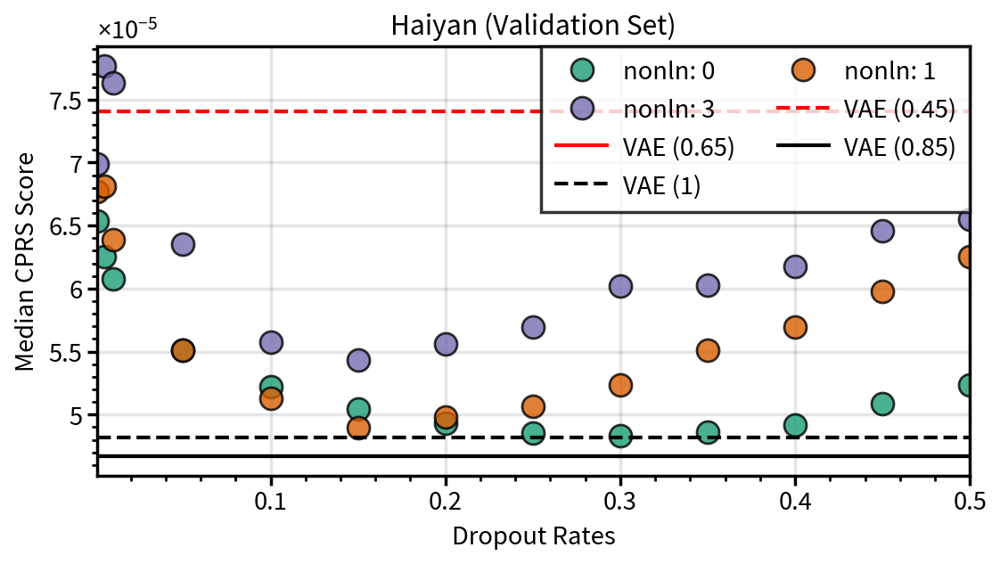

In [8]:
plot.rc.metacolor = 'k'
plot.rc.update({'axes.labelweight':'normal','tick.labelweight':'normal','figure.facecolor':'w','title.color':'k','fontname': 'Source Sans Pro', 'fontsize': 11,'linewidth':1.25})
plot.rc.axesfacecolor = 'w'
from mycolorpy import colorlist as mcp
color1=mcp.gen_color(cmap="Dark2",n=7)
print(color1)

fig,axs = plot.subplots(ncols=1,nrows=1,axwidth=4.895,refaspect=2.031)
for ind,obj in enumerate([0,1,3]):#,5,7,9,11]):
    axs[0].plot(droprates,[np.nanmedian(read_and_proc.flatten([obj[i]['r2vals'] for i in range(40)])) for obj in list(crps_store[obj].values())],lw=0,label='nonln: '+str(obj),marker='o',mfc=color1[ind],
                mew=1,mec='k',markersize=9,alpha=0.8)

axs[0].axhline(np.nanmedian(read_and_proc.flatten([obj['r2vals'] for obj in (crps_store_vae[0.45])])),color='r',ls='--',label='VAE (0.45)')
axs[0].axhline(np.nanmedian(read_and_proc.flatten([obj['r2vals'] for obj in (crps_store_vae[0.65])])),color='r',label='VAE (0.65)')
axs[0].axhline(np.nanmedian(read_and_proc.flatten([obj['r2vals'] for obj in (crps_store_vae[0.85])])),color='k',label='VAE (0.85)')
axs[0].axhline(np.nanmedian(read_and_proc.flatten([obj['r2vals'] for obj in (crps_store_vae[0.95])])),color='k',ls='--',label='VAE (1)')
#axs[0].plot(droprates,[np.nanmedian(read_and_proc.flatten([obj[i]['r2vals'] for i in range(3)])) for obj in list(crps_performance.values())],lw=0,label='Validation',marker='o',mfc='C1',mew=1,mec='k',markersize=9,alpha=0.8)
#axs[0].plot(droprates,[np.nanmedian(read_and_proc.flatten([obj[i]['r2tests'] for i in range(3)])) for obj in list(crps_performance.values())],lw=0,label='Test',marker='o',mfc='C2',mew=1,mec='k',markersize=9,alpha=0.8)
axs.legend(loc=1,ncols=2)
axs.format(xlabel='Dropout Rates',ylabel='Median CPRS Score',title='Haiyan (Validation Set)',)#ylim=[0.5e-5,20.5e-5],xlim=[-0.01,0.525])
plt.savefig('./figures/CPRSmedian_revised_haiyan_nonln_valid_vae.png',dpi=600)
plt.show()

['#1b9e77', '#d95f02', '#7570b3', '#66a61e', '#e6ab02', '#a6761d', '#666666']


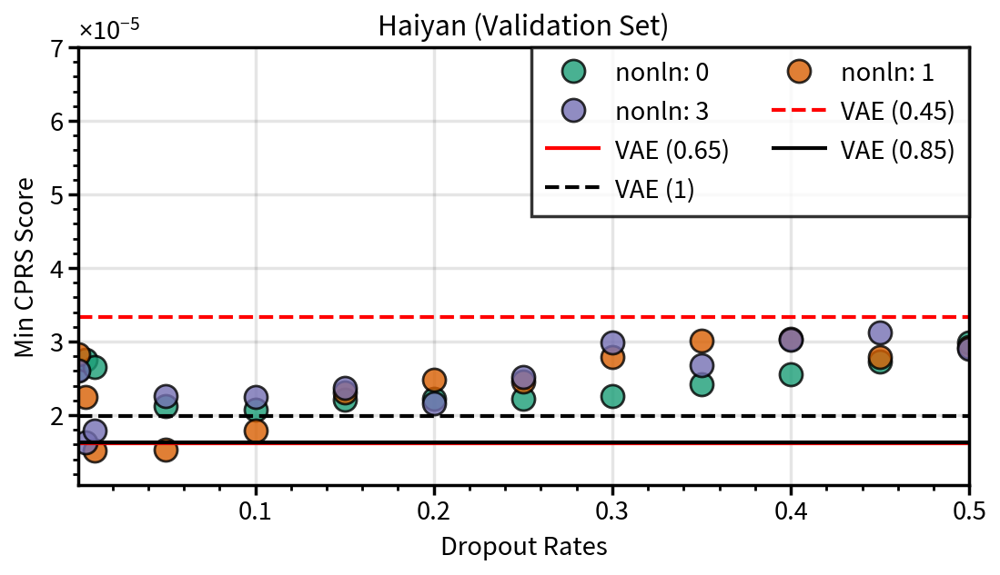

In [9]:
plot.rc.metacolor = 'k'
plot.rc.update({'axes.labelweight':'normal','tick.labelweight':'normal','figure.facecolor':'w','title.color':'k','fontname': 'Source Sans Pro', 'fontsize': 11,'linewidth':1.25})
plot.rc.axesfacecolor = 'w'
from mycolorpy import colorlist as mcp
color1=mcp.gen_color(cmap="Dark2",n=7)
print(color1)

fig,axs = plot.subplots(ncols=1,nrows=1,axwidth=4.895,refaspect=2.031)
for ind,obj in enumerate([0,1,3]):#,1,3]):#,5,7,9,11]):
    axs[0].plot(droprates,[np.nanmin(read_and_proc.flatten([obj[i]['r2vals'] for i in range(40)])) for obj in list(crps_store[obj].values())],lw=0,label='nonln: '+str(obj),marker='o',mfc=color1[ind],
                mew=1,mec='k',markersize=9,alpha=0.8)

axs[0].axhline(np.nanmin(read_and_proc.flatten([obj['r2vals'] for obj in (crps_store_vae[0.45])])),color='r',ls='--',label='VAE (0.45)')
axs[0].axhline(np.nanmin(read_and_proc.flatten([obj['r2vals'] for obj in (crps_store_vae[0.65])])),color='r',label='VAE (0.65)')
axs[0].axhline(np.nanmin(read_and_proc.flatten([obj['r2vals'] for obj in (crps_store_vae[0.85])])),color='k',label='VAE (0.85)')
axs[0].axhline(np.nanmin(read_and_proc.flatten([obj['r2vals'] for obj in (crps_store_vae[0.95])])),color='k',ls='--',label='VAE (1)')
#axs[0].plot(droprates,[np.nanmedian(read_and_proc.flatten([obj[i]['r2vals'] for i in range(3)])) for obj in list(crps_performance.values())],lw=0,label='Validation',marker='o',mfc='C1',mew=1,mec='k',markersize=9,alpha=0.8)
#axs[0].plot(droprates,[np.nanmedian(read_and_proc.flatten([obj[i]['r2tests'] for i in range(3)])) for obj in list(crps_performance.values())],lw=0,label='Test',marker='o',mfc='C2',mew=1,mec='k',markersize=9,alpha=0.8)
axs.legend(loc=1,ncols=2)
axs.format(xlabel='Dropout Rates',ylabel='Min CPRS Score',title='Haiyan (Validation Set)',ylim=[1.05e-5,7e-5])#ylim=[0.5e-5,20.5e-5],xlim=[-0.01,0.525])
plt.savefig('./figures/CPRSmin_revised_haiyan_nonln_valid_vae.png',dpi=600)
plt.show()

## Spread-skill

In [10]:
import importlib,plotting
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
importlib.reload(plotting)

<module 'plotting' from '/work/FAC/FGSE/IDYST/tbeucler/default/freddy0218/TCGphy/2020_TC_CRF/dev/freddy0218/TCG_Rad_keras/finalver/plotting.py'>

In [15]:
snum=2
coeff=0.75
splitno = 19
modelno = 0

def get_spread_skill_score_model(seeds_store=seeds_store,seeds=seeds,snum=snum,coeff=coeff,splitno=splitno,modelno=modelno,category='valid',meancat='meanvals'):
    aaaaaa = [np.percentile(seeds_store[seeds[snum]][coeff][splitno]['spreads'][modelno][category],i) for i in np.arange(0,95,5)]
    
    hihihi = []
    hihihib = []

    ssRel = 0
    nPts = np.asarray(seeds_store[seeds[snum]][coeff][splitno]['truth'][modelno][category]).size
    for i in range(len(aaaaaa)-1):
        ytruth = np.asarray(seeds_store[seeds[snum]][coeff][splitno]['truth'][modelno][category])[np.where(np.logical_and(seeds_store[seeds[snum]][coeff][splitno]['spreads'][modelno][category]>aaaaaa[i],
                                                                                                                         seeds_store[seeds[snum]][coeff][splitno]['spreads'][modelno][category]<aaaaaa[i+1]))]
        nPtsbin = ytruth.size
        ypred = np.asarray(seeds_store[seeds[snum]][coeff][splitno][meancat][modelno])[np.where(np.logical_and(seeds_store[seeds[snum]][coeff][splitno]['spreads'][modelno][category]>aaaaaa[i],
                                                                                                                  seeds_store[seeds[snum]][coeff][splitno]['spreads'][modelno][category]<aaaaaa[i+1]))]
        spreadss = np.asarray(seeds_store[seeds[snum]][coeff][splitno]['spreads'][modelno][category])[np.where(np.logical_and(seeds_store[seeds[snum]][coeff][splitno]['spreads'][modelno][category]>aaaaaa[i],
                                                                                                                             seeds_store[seeds[snum]][coeff][splitno]['spreads'][modelno][category]<aaaaaa[i+1]))] 
        try:
            hihihi.append(np.sqrt(mean_squared_error(ytruth,ypred)))
            ssRel += (nPtsbin/nPts) * np.abs(np.sqrt(mean_squared_error(ytruth,ypred)) - np.mean(spreadss))
        except:
            hihihi.append(np.nan)
            ssRel += 0
    return {'spreadlim':aaaaaa,'error':hihihi,'ssRel':ssRel}

In [16]:
snum=2
coeff=0.75
splitno = 19
modelno = 0

allsave = []
for snumz in tqdm(np.linspace(0,19,20)):
    tmpsave_1 = {}
    for coeffz in losscoeffs:
        tmpsave_2 = []
        for splitnoz in range(39):
            snumz=int(snumz)
            tempsNUM = len(seeds_store[seeds[snumz]][coeffz][splitnoz]['truth'])
            tmpsave_3 = [get_spread_skill_score_model(seeds_store=seeds_store,seeds=seeds,snum=snumz,coeff=coeffz,splitno=splitnoz,modelno=i,category='valid',meancat='meanvals') for i in range(tempsNUM)]
            tmpsave_2.append(tmpsave_3)
        tmpsave_1[coeffz] = tmpsave_2
    allsave.append(tmpsave_1)

  0%|          | 0/20 [00:00<?, ?it/s]

In [17]:
ssRels_array = np.zeros((39,9))
for i in (range(39)):
    for j in (range(9)):
        ssRels_array[i,j] = np.asarray([allsave[k][0.85][i][j]['ssRel'] for k in range(20)]).min()
        
#np.argwhere(ssRels_array == np.min(ssRels_array))
#np.dstack(np.unravel_index(np.argsort(ssRels_array.ravel()), ssRels_array.shape))

testst = plotting.spread_error_diagram([0,10,20,30,40,50,60,70,80,90,100],'valid',crps_store[0],droprates).get_allcriteria()
testst_flatten = plotting.spread_error_diagram([0,10,20,30,40,50,60,70,80,90,100],'valid',crps_store[0],droprates).get_criteria_flatten() #[70,74,78,82,86,90,94,98,100]
curves_models,ssrels = plotting.spread_error_diagram([0,10,20,30,40,50,60,70,80,90,100],'valid',crps_store[0],droprates).get_rmse_curve(testst_flatten)
ssrats = plotting.spread_error_diagram([0,10,20,30,40,50,60,70,80,90,100],'valid',crps_store[0],droprates).get_ssrat()

In [18]:
def get_vae_performance(storeresult=None):
    testst_vae = plotting.spread_error_diagram([0,20,40,60,80,100],'valid',storeresult,losscoeffs).get_allcriteria()
    testst_flatten_vae = plotting.spread_error_diagram([0,20,40,60,80,100],'valid',storeresult,losscoeffs).get_criteria_flatten()
    curves_models_vae,ssrels_vae = plotting.spread_error_diagram([0,20,40,60,80,100],'valid',storeresult,losscoeffs).get_rmse_curve(testst_flatten_vae)
    ssrats_vae = plotting.spread_error_diagram([0,20,40,60,80,100],'valid',storeresult,losscoeffs).get_ssrat()
    
    valsplit2_vaes = []
    modelnum2_vaes = []
    for ind,losscoefff in enumerate(losscoeffs):
        dropr_vae,valsplit2_vae,modelnum2_vae = ssrelminindex_vae,np.asarray([np.asarray(obj).min() for obj in ssrels_vae[ssrelminindex_vae]]).argmin(),\
        np.asarray(ssrels_vae[ssrelminindex_vae][np.asarray([np.asarray(obj).min() for obj in ssrels_vae[ssrelminindex_vae]]).argmin()]).argmin()
        valsplit2_vaes.append(valsplit2_vae)
        modelnum2_vaes.append(modelnum2_vae)
    return {'testst_flatten':testst_flatten_vae,'curve_models':curves_models_vae,'ssrels':ssrels_vae,'ssrats':ssrats_vae,'valsplit':valsplit2_vaes,'modelnum':modelnum2_vaes}

In [40]:
benchmark.model_outweights_all(bestmodel)

([Parameter containing:
  tensor([[ 0.6774, -0.4570,  0.5172,  0.1105,  0.1985,  0.0912, -0.0389,  0.0471,
            0.0694,  0.0936,  0.0138, -0.0378, -0.1638,  0.2664, -0.0896, -0.0335,
           -0.1552,  0.1417, -0.0759,  0.1475]], requires_grad=True),
  Parameter containing:
  tensor([0.0915], requires_grad=True),
  Parameter containing:
  tensor([[-0.6418,  0.1509,  0.2252,  0.0113, -0.0111,  0.2962, -0.0075,  0.0007,
            0.0375,  0.0613,  0.0013,  0.1081,  0.1269,  0.1212,  0.0671, -0.1009,
           -0.1078, -0.0726, -0.0113, -0.1170]], requires_grad=True),
  Parameter containing:
  tensor([-1.6324], requires_grad=True),
  Parameter containing:
  tensor([[-0.1462,  0.2834, -0.0172, -0.0700, -0.0862,  0.0238,  0.0861, -0.0168,
            0.0327, -0.0262, -0.0921, -0.0017,  0.1035, -0.0437, -0.1402,  0.1172,
           -0.0965,  0.0494, -0.0476,  0.0521]], requires_grad=True),
  Parameter containing:
  tensor([0.0823], requires_grad=True),
  Parameter containing:
  t

In [19]:
allvaes = {}
for seedvae in tqdm(seeds):
    allvaes[seedvae] = get_vae_performance(seeds_store[seedvae])

  0%|          | 0/20 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
testst_vae = plotting.spread_error_diagram([0,20,40,60,80,100],'valid',seeds_store[seeds[0]],losscoeffs).get_allcriteria()
testst_flatten_vae = plotting.spread_error_diagram([0,20,40,60,80,100],'valid',seeds_store[seeds[0]],losscoeffs).get_criteria_flatten() #[70,74,78,82,86,90,94,98,100]
curves_models_vae,ssrels_vae = plotting.spread_error_diagram([0,20,40,60,80,100],'valid',seeds_store[seeds[0]],losscoeffs).get_rmse_curve(testst_flatten_vae)
#_,ssrels_orig_vae = plotting.spread_error_diagram([0,20,40,60,80,100],'valid',crps_store_vae,losscoeffs).get_rmse_curve(testst_flatten_vae)
ssrats_vae = plotting.spread_error_diagram([0,20,40,60,80,100],'valid',seeds_store[seeds[0]],losscoeffs).get_ssrat()

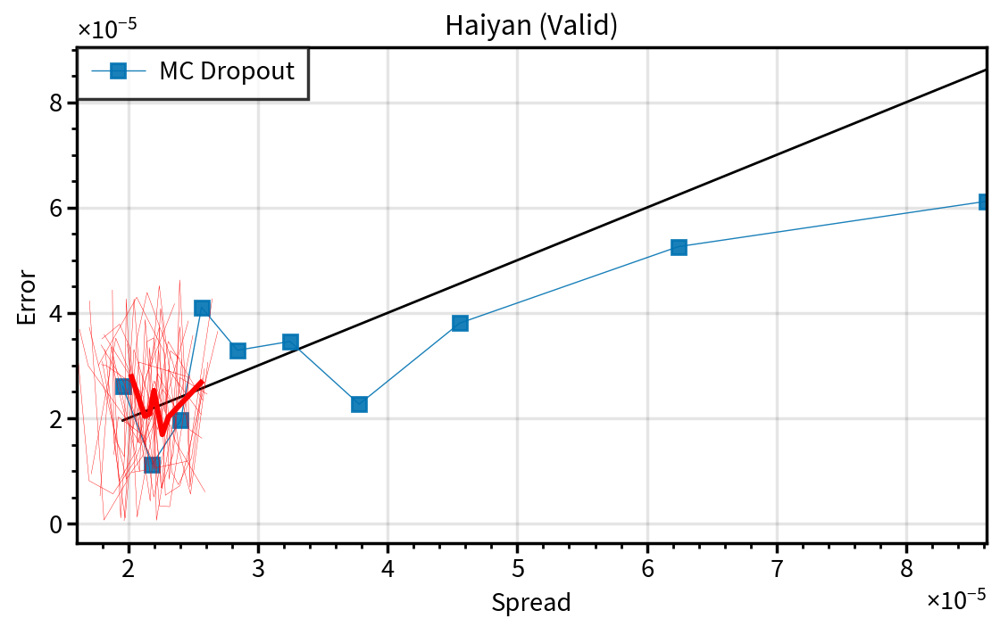

In [20]:
ssrelminindex,ssrelminindex_vae = 8,1
dropr,valsplit2,modelnum2 = ssrelminindex,np.asarray([np.asarray(obj).min() for obj in ssrels[ssrelminindex]]).argmin(),np.asarray(ssrels[ssrelminindex][np.asarray([np.asarray(obj).min() for obj in ssrels[ssrelminindex]]).argmin()]).argmin()
#dropr_vae,valsplit2_vae,modelnum2_vae = ssrelminindex_vae,np.asarray([np.asarray(obj).min() for obj in ssrels_vae[ssrelminindex_vae]]).argmin(),\
#np.asarray(ssrels_vae[ssrelminindex_vae][np.asarray([np.asarray(obj).min() for obj in ssrels_vae[ssrelminindex_vae]]).argmin()]).argmin()
plot.rc.metacolor = 'k'
plot.rc.update({'axes.labelweight':'normal','tick.labelweight':'normal','figure.facecolor':'w','title.color':'k','fontname': 'Source Sans Pro', 'fontsize': 11,'linewidth':1.25})
plot.rc.axesfacecolor = 'w'

fig,axs = plot.subplots(ncols=1,nrows=1,axwidth=5.095,refaspect=1.831,sharey=3)
axs[0].plot(testst_flatten[dropr][valsplit2][1:],testst_flatten[dropr][valsplit2][1:],color='k',lw=1)
curvefin = curves_models[dropr][valsplit2]
#plt.plot(testst_flatten[dropr][valsplit2][1:],curvefin[modelnum2],marker='s',lw=0.5,label=i,alpha=0.9)
axs[0].plot(testst_flatten[dropr][valsplit2][1:],curves_models[dropr][valsplit2][modelnum2],marker='s',lw=0.5,label='MC Dropout',alpha=0.9,)

hihihi = []
for snumz in np.linspace(0,19,20):
    newX = np.asarray(allsave[int(snumz)][0.85][26][8]['spreadlim'][1:])[~np.isnan(allsave[int(snumz)][0.85][26][8]['error'])]
    newY = np.asarray(allsave[int(snumz)][0.85][26][8]['error'])[~np.isnan(allsave[int(snumz)][0.85][26][8]['error'])]
    axs[0].plot(newX,newY,lw=0.15,color='r')
    hihihi.append(newY)
axs[0].plot(newX,np.mean(np.asarray(hihihi),axis=0),lw=2.15,color='r')
#plt.plot(testst_flatten_vae[0][valsplit2_vae][1:],testst_flatten_vae[0][valsplit2_vae][1:],color='k',lw=1)
#axs[0].plot(testst_flatten_vae[dropr_vae][valsplit2_vae][1:],curves_models_vae[dropr_vae][valsplit2_vae][modelnum2_vae],marker='s',lw=0.5,label='VAE',alpha=0.9,)
axs[0].format(xlabel='Spread',ylabel='Error',title='Haiyan (Valid)')
plt.legend(loc=1)
#plt.savefig('./figures/spreadskill_compare.png',dpi=600)
plt.show()

In [147]:
import importlib
importlib.reload(benchmark)

<module 'benchmark' from '/work/FAC/FGSE/IDYST/tbeucler/default/freddy0218/TCGphy/2020_TC_CRF/dev/freddy0218/TCG_Rad_keras/finalver/benchmark.py'>

In [148]:
bestmodel = seeds_store[seeds[0]][0.85][26]['models'][8]
ALW = benchmark.analysis_patterns(None,None).new_coeff_vae(store_notensor[26]['train'][0],bestmodel,'LW',[-40,-20])
ASW = benchmark.analysis_patterns(None,None).new_coeff_vae(store_notensor[26]['train'][0],bestmodel,'SW',[-40,-20])
B = benchmark.analysis_patterns(None,None).new_b_vae(store_notensor[26]['train'][0],bestmodel,[-40,-20])#+5.4267e-05*np.exp(0.5)+2.6588e-05*np.exp(0.5)
#5.4267e-05*(0.5*benchmark.analysis_patterns(None,None).new_coeff_vae(store_notensor[26]['train'][0],bestmodel,'LW_logvar',[-40,-20])*np.dot(np.asarray(store_notensor[valsplit_vae]['train'][0])[:,-40:-20],fl))+\
#           2.6588e-05*(0.5*benchmark.analysis_patterns(None,None).new_coeff_vae(store_notensor[26]['train'][0],bestmodel,'SW_logvar',[-40,-20])*np.dot(np.asarray(store_notensor[valsplit_vae]['train'][0])[:,-20:],fl))

pcalw,pcasw = read_and_proc.depickle('./haiyan_store/pca/lw/'+str(26)+'/PCA3D.pkg'),read_and_proc.depickle('./haiyan_store/pca/sw/'+str(26)+'/PCA3D.pkg')
fl = benchmark.analysis_patterns(None,None).new_structure_vae(store_notensor[26]['train'][0],bestmodel,'LW')
fl_logvar = benchmark.analysis_patterns(None,None).new_structure_vae(store_notensor[26]['train'][0],bestmodel,'LW_logvar')
flsw_logvar = benchmark.analysis_patterns(None,None).new_structure_vae(store_notensor[26]['train'][0],bestmodel,'SW_logvar')
flsw = benchmark.analysis_patterns(None,None).new_structure_vae(store_notensor[26]['train'][0],bestmodel,'SW')
flas = np.squeeze(np.dot(fl,pcalw['lw'].components_[:20,:])).reshape(10,360,208)
flas_logvar = np.squeeze(np.dot(fl_logvar,pcalw['lw'].components_[:20,:])).reshape(10,360,208)
flsws_logvar = np.squeeze(np.dot(flsw_logvar,pcasw['sw'].components_[:20,:])).reshape(10,360,208)
#flas_sw = np.squeeze(np.dot(flsw,pcasw['sw'].components_[:20,:])).reshape(10,360,208)

In [175]:
LW = (np.asarray(store_notensor[26]['train'][0])[:,-40:-20])
SW = (np.asarray(store_notensor[26]['train'][0])[:,-20:])

In [176]:
sssss = np.sum((benchmark.model_outweights_all(bestmodel)[0][2][0].detach().numpy()/np.std(LW,axis=0)*np.mean(LW,axis=0)))
sssss_sw = np.sum((benchmark.model_outweights_all(bestmodel)[0][6][0].detach().numpy()/np.std(SW,axis=0)*np.mean(SW,axis=0)))

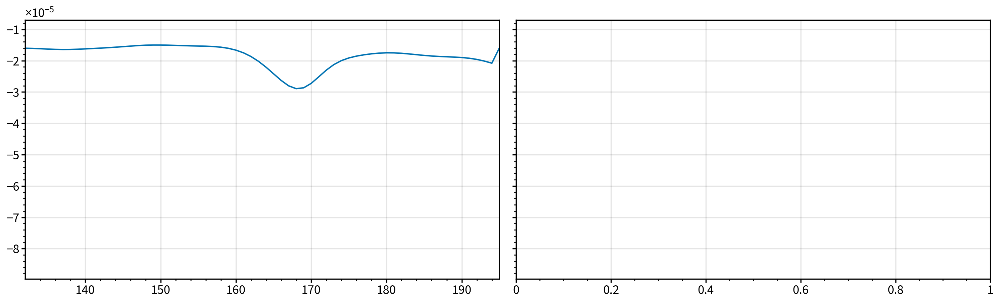

In [177]:
fig,axs = plot.subplots(ncols=2,nrows=1,axwidth=7.095,refaspect=1.831,sharey=3)
axs[0].plot(np.random.randn(1)*5.4267e-05*(np.exp(0.5*np.dot(np.asarray(store_notensor[valsplit_vae]['train'][0])[:,-40:-20],fl_logvar))*np.exp(-1.6324/2)/np.exp(0.5*sssss))+\
            np.random.randn(1)*(2.6588e-05*(np.exp(0.5*np.dot(np.asarray(store_notensor[valsplit_vae]['train'][0])[:,-20:],flsw_logvar))*np.exp(-1.3649/2)/np.exp(0.5*sssss_sw))))
axs[0].format(xlim=[132,195])
plt.show()

In [172]:
NINN = np.random.randn(1)*5.4267e-05*(np.exp(0.5*np.dot(np.asarray(store_notensor[valsplit_vae]['train'][0])[:,-40:-20],fl_logvar))*np.exp(-1.6324/2)/np.exp(0.5*sssss))+\
            np.random.randn(1)*(2.6588e-05*(np.exp(0.5*np.dot(np.asarray(store_notensor[valsplit_vae]['train'][0])[:,-20:],flsw_logvar))*np.exp(-1.3649/2)/np.exp(0.5*sssss_sw)))

In [138]:
AAAAAAA = ALW*np.dot(np.asarray(store_notensor[valsplit_vae]['train'][0])[:,-40:-20],fl)+ASW*np.dot(np.asarray(store_notensor[valsplit_vae]['train'][0])[:,-20:],flsw)+B+NINN

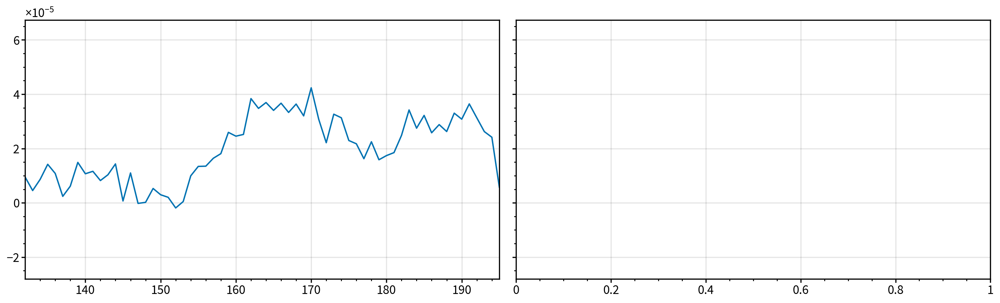

In [173]:
fig,axs = plot.subplots(ncols=2,nrows=1,axwidth=7.095,refaspect=1.831,sharey=3)
axs[0].plot(seeds_store[seeds[0]][accesscode][int(valsplit_vae)]['meantrains'][int(modelnum)]-AAAAAAA-NINN)
#axs[0].plot(5.4267e-05*np.exp(0.5*benchmark.analysis_patterns(None,None).new_coeff_vae(store_notensor[26]['train'][0],bestmodel,'LW_logvar',[-40,-20])*np.dot(np.asarray(store_notensor[valsplit_vae]['train'][0])[:,-40:-20],fl_logvar))+\
#           2.6588e-05*np.exp(0.5*benchmark.analysis_patterns(None,None).new_coeff_vae(store_notensor[26]['train'][0],bestmodel,'SW_logvar',[-40,-20])*np.dot(np.asarray(store_notensor[valsplit_vae]['train'][0])[:,-20:],fl_)))
axs[0].format(xlim=[132,195])
plt.show()

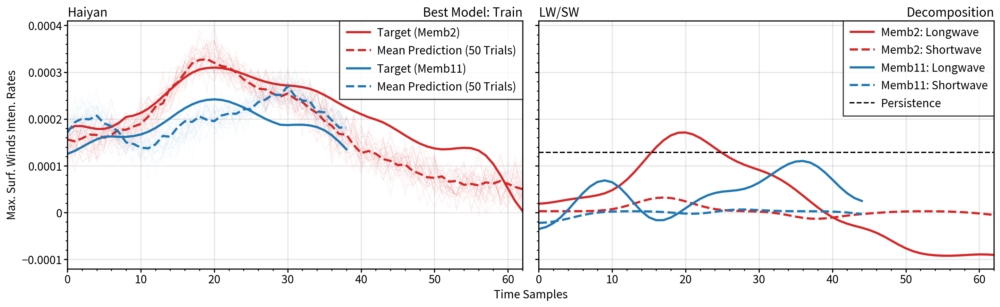

In [178]:
plot.rc.update({'axes.labelweight':'normal','tick.labelweight':'normal','figure.facecolor':'w','title.color':'k','fontname': 'Source Sans Pro', 'fontsize': 14.05,'linewidth':1.25})
plot.rc.axesfacecolor = 'w'

accesscode = 0.85
valsplit_vae=26
modelnum=8

fig,axs = plot.subplots(ncols=2,nrows=1,axwidth=7.095,refaspect=1.831,sharey=3)
axs[0].plot(store_notensor[valsplit_vae]['train'][1][132:195],label=f'Target (Memb2)',c='tab:red',lw=2.5)#79:132])
axs[0].plot(seeds_store[seeds[0]][accesscode][int(valsplit_vae)]['meantrains'][int(modelnum)][132:195],label='Mean Prediction (50 Trials)',c='tab:red',lw=2.5,ls='--')#79:132])
allpreds = seeds_store[seeds[0]][accesscode][int(valsplit_vae)]['alltrains'][int(modelnum)]
for pred in allpreds:
    axs[0].plot(pred[132:195],c='tab:red',lw=0.5,alpha=0.105)
    
axs[0].plot(store_notensor[valsplit_vae]['train'][1][616:655],label=f'Target (Memb11)',c='tab:blue',lw=2.5)#79:132])
axs[0].plot(seeds_store[seeds[0]][accesscode][int(valsplit_vae)]['meantrains'][int(modelnum)][616:655],label='Mean Prediction (50 Trials)',c='tab:blue',lw=2.5,ls='--')#79:132])
allpreds = seeds_store[seeds[0]][accesscode][int(valsplit_vae)]['alltrains'][int(modelnum)]
for pred in allpreds:
    axs[0].plot(pred[616:655],c='tab:blue',lw=0.5,alpha=0.05)
    
axs[0].legend(loc=1,ncols=1)
#r2_scoress = r2_score(store_notensor[valsplit_vae]['train'][1],r2_performance[accesscode][int(valsplit_vae)]['meantrains'][int(modelnum)])
axs[0].format(xlabel='Time Samples',ylabel='Max. Surf. Winds Inten. Rates',ltitle='Haiyan',rtitle=f'Best Model: Train')

axs[1].plot(ALW*np.dot(np.asarray(store_notensor[valsplit_vae]['train'][0])[:,-40:-20],fl)[132:195],label='Memb2: Longwave',c='tab:red',lw=2.5)#79:132])
axs[1].plot(ASW*np.dot(np.asarray(store_notensor[valsplit_vae]['train'][0])[:,-20:],flsw)[132:195],label='Memb2: Shortwave',c='tab:red',lw=2.5,ls='--')
#axs[1].plot(ALW*np.dot(np.asarray(store_notensor[valsplit_vae]['train'][0])[:,-40:-20],fl)[558:606],label='Memb11: Longwave',c='tab:blue',lw=2.5)#79:132])
#axs[1].plot(ASW*np.dot(np.asarray(store_notensor[valsplit_vae]['train'][0])[:,-20:],flsw)[558:606],label='Memb11: Shortwave',c='tab:blue',lw=2.5,ls='--')
axs[1].plot(ALW*np.dot(np.asarray(store_notensor[valsplit_vae]['train'][0])[:,-40:-20],fl)[610:655],label='Memb11: Longwave',c='tab:blue',lw=2.5)#79:132])
axs[1].plot(ASW*np.dot(np.asarray(store_notensor[valsplit_vae]['train'][0])[:,-20:],flsw)[610:655],label='Memb11: Shortwave',c='tab:blue',lw=2.5,ls='--')
#axs[1].plot((seeds_store[seeds[0]][accesscode][int(valsplit_vae)]['meantrains'][int(modelnum)]-AAAAAAA-NINN)[132:195])
axs[1].axhline(y=B,label='Persistence',c='k',lw=1.5,ls='--')
axs[1].legend(loc=1,ncols=1)
axs[1].format(xlabel='Time Samples',ylabel=r'Max. Surf. Winds Inten. Rates',ltitle='LW/SW',rtitle=f'Decomposition',ylim=[-0.00012,0.00041])#,xlim=[10,118-15])

#plt.savefig('./figures/paper_fig2_haiyan_revised.png',dpi=600)
plt.show()

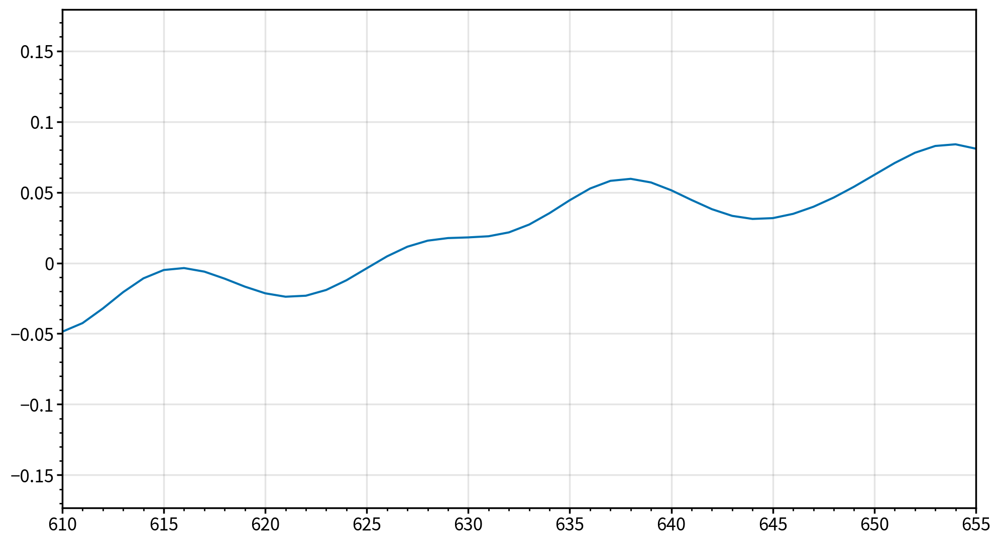

In [84]:
fig,axs = plot.subplots(ncols=1,nrows=1,axwidth=9.095,refaspect=1.831,sharey=3)
plt.plot(np.dot(np.asarray(store_low[26]['train'][0])[:,-40:-20],fl))
plt.xlim(610,655)
plt.show()

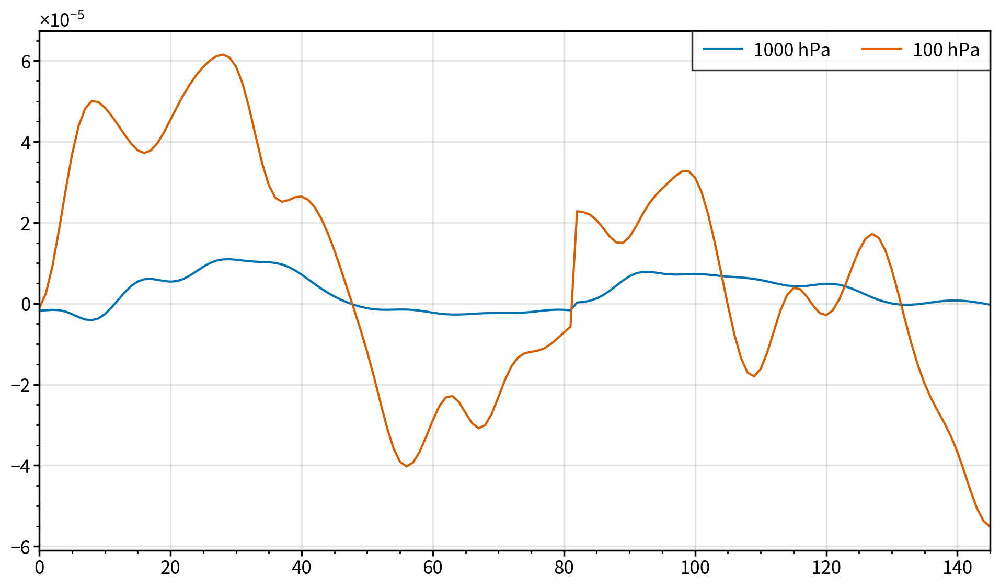

In [67]:
fig,axs = plot.subplots(ncols=1,nrows=1,axwidth=9.095,refaspect=1.831,sharey=3)
hihihi_a = ALW*np.dot(np.asarray(store_low[26]['test'][0])[:,-40:-20],fl)
plt.plot((hihihi_a),label='1000 hPa')#-np.mean(hihihi_a))/np.std(hihihi_a))
hihihi_a = ALW*np.dot(np.asarray(store_upper[26]['test'][0])[:,-40:-20],fl)
plt.plot((hihihi_a),label='100 hPa')#-np.mean(hihihi_a))/np.std(hihihi_a))
#hihihi_a = ALW*np.dot(np.asarray(store_low[26]['train'][0])[:,-40:-20],fl)
#plt.plot((hihihi_a-np.mean(hihihi_a))/np.std(hihihi_a))
plt.legend()
plt.show()

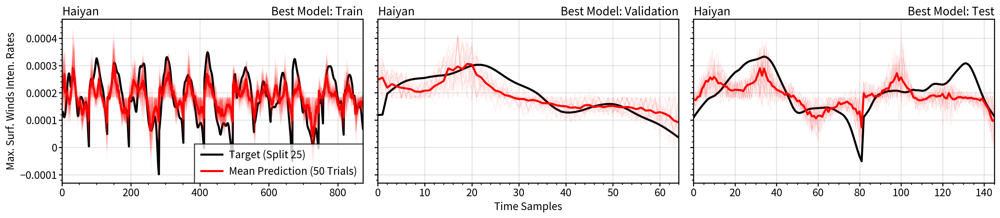

In [88]:
plot.rc.update({'axes.labelweight':'normal','tick.labelweight':'normal','figure.facecolor':'w','title.color':'k','fontname': 'Source Sans Pro', 'fontsize': 14.05,'linewidth':1.25})
plot.rc.axesfacecolor = 'w'

accesscode = 0.3
r2_performance = crps_store[0]
fig,axs = plot.subplots(ncols=3,nrows=1,axwidth=5.095,refaspect=1.831,sharey=3)
axs[0].plot(store_notensor[valsplit2]['train'][1],label=f'Target (Split {valsplit2})',c='k',lw=2.5)#79:132])
axs[0].plot(crps_store[0][accesscode][int(valsplit2)]['meantrains'][int(modelnum2)],label='Mean Prediction (50 Trials)',c='r',lw=2.5)#79:132])

allpreds = crps_store[0][accesscode][int(valsplit2)]['alltrains'][int(modelnum2)]
for pred in allpreds:
    axs[0].plot(pred,c='r',lw=0.35,alpha=0.085)
axs[0].legend(loc=4,ncols=1)
#r2_scoress = crps_score(store_notensor[valsplit]['train'][1],r2_performance[accesscode][int(valsplit)]['meantrains'][int(modelnum)])
axs[0].format(xlabel='Time Samples',ylabel='Max. Surf. Winds Inten. Rates',ltitle='Haiyan',rtitle=f'Best Model: Train')

axs[1].plot(store_notensor[valsplit2]['valid'][1],label=f'Target (Split {valsplit2})',c='k',lw=2.5)#79:132])
axs[1].plot(crps_store[0][accesscode][int(valsplit2)]['meanvals'][int(modelnum2)],label='Mean Prediction (50 Trials)',c='r',lw=2.5)#79:132])
allpreds = crps_store[0][accesscode][int(valsplit2)]['allvals'][int(modelnum2)]
for pred in allpreds:
    axs[1].plot(pred,c='r',lw=0.35,alpha=0.105)
#r2_scoress = r2_score(y_toval,r2_performance[accesscode][int(valsplit)]['meanvals'][int(modelnum)])
axs[1].format(xlabel='Time Samples',ylabel='Max. Surf. Winds Inten. Rates',ltitle='Haiyan',rtitle=f'Best Model: Validation')#,rtitle='Optimal Longwave')
#plt.savefig('../analysis/pic/climateinfo/MCdropout_testskill_revised.png',dpi=600)

axs[2].plot(store_notensor[valsplit2]['test'][1],label=f'Target (Split {valsplit2})',c='k',lw=2.5)#79:132])
axs[2].plot(crps_store[0][accesscode][int(valsplit2)]['meantests'][int(modelnum2)],label='Mean Prediction (50 Trials)',c='r',lw=2.5)#79:132])
allpreds = crps_store[0][accesscode][int(valsplit2)]['alltests'][int(modelnum2)]
for pred in allpreds:
    axs[2].plot(pred,c='r',lw=0.35,alpha=0.105)
#r2_scoress = r2_score(y_totest,r2_performance[accesscode][int(valsplit)]['meantests'][int(modelnum)])
axs[2].format(xlabel='Time Samples',ylabel='Max. Surf. Winds Inten. Rates',ltitle='Haiyan',rtitle=f'Best Model: Test')#,rtitle='Optimal Longwave')

#axs[3].plot(store_notensor[valsplit]['test'][1],c='k',lw=2.5)
#axs[3].plot(r2_performance[accesscode][int(valsplit)]['meantests'][int(modelnum)],label='Mean Prediction (50 Trials)',c='r',lw=2.5)

#allpres = r2_performance[accesscode][int(valsplit)]['alltests'][int(modelnum)]
#for allpre in allpres:
#    axs[3].plot(allpre,label='Mean Prediction (50 Trials)',c='r',lw=0.15,alpha=0.22)
#axs[3].format(xlim=[0,82],title='Member 11') #xlim=[82,145]
plt.savefig('./figures/paper_si_haiyan_revised_bestlinear.png',dpi=600)
plt.show()

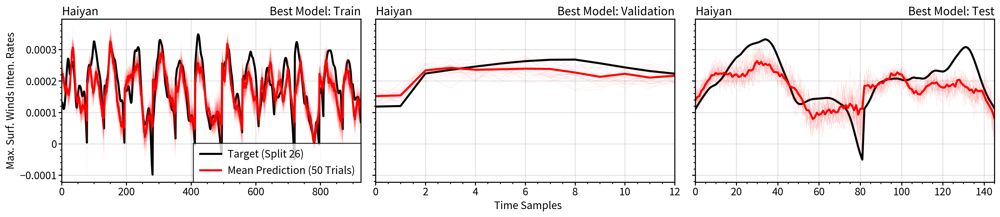

In [13]:
plot.rc.update({'axes.labelweight':'normal','tick.labelweight':'normal','figure.facecolor':'w','title.color':'k','fontname': 'Source Sans Pro', 'fontsize': 14.05,'linewidth':1.25})
plot.rc.axesfacecolor = 'w'

accesscode = 0.85
valsplit2_vae=26
modelnum2_vae=8
fig,axs = plot.subplots(ncols=3,nrows=1,axwidth=5.095,refaspect=1.831,sharey=3)
axs[0].plot(store_notensor[valsplit2_vae]['train'][1],label=f'Target (Split {valsplit2_vae})',c='k',lw=2.5)#79:132])
axs[0].plot(crps_store_vae[accesscode][int(valsplit2_vae)]['meantrains'][int(modelnum2_vae)],label='Mean Prediction (50 Trials)',c='r',lw=2.5)#79:132])

allpreds = crps_store_vae[accesscode][int(valsplit2_vae)]['alltrains'][int(modelnum2_vae)]
for pred in allpreds:
    axs[0].plot(pred,c='r',lw=0.35,alpha=0.085)
axs[0].legend(loc=4,ncols=1)
#r2_scoress = crps_score(store_notensor[valsplit]['train'][1],r2_performance[accesscode][int(valsplit)]['meantrains'][int(modelnum)])
axs[0].format(xlabel='Time Samples',ylabel='Max. Surf. Winds Inten. Rates',ltitle='Haiyan',rtitle=f'Best Model: Train')

axs[1].plot(store_notensor[valsplit2_vae]['valid'][1],label=f'Target (Split {valsplit2_vae})',c='k',lw=2.5)#79:132])
axs[1].plot(crps_store_vae[accesscode][int(valsplit2_vae)]['meanvals'][int(modelnum2_vae)],label='Mean Prediction (50 Trials)',c='r',lw=2.5)#79:132])
allpreds = crps_store_vae[accesscode][int(valsplit2_vae)]['allvals'][int(modelnum2_vae)]
for pred in allpreds:
    axs[1].plot(pred,c='r',lw=0.35,alpha=0.105)
#r2_scoress = r2_score(y_toval,r2_performance[accesscode][int(valsplit)]['meanvals'][int(modelnum)])
axs[1].format(xlabel='Time Samples',ylabel='Max. Surf. Winds Inten. Rates',ltitle='Haiyan',rtitle=f'Best Model: Validation')#,rtitle='Optimal Longwave')
#plt.savefig('../analysis/pic/climateinfo/MCdropout_testskill_revised.png',dpi=600)

axs[2].plot(store_notensor[valsplit2_vae]['test'][1],label=f'Target (Split {valsplit2_vae})',c='k',lw=2.5)#79:132])
axs[2].plot(crps_store_vae[accesscode][int(valsplit2_vae)]['meantests'][int(modelnum2_vae)],label='Mean Prediction (50 Trials)',c='r',lw=2.5)#79:132])
allpreds = crps_store_vae[accesscode][int(valsplit2_vae)]['alltests'][int(modelnum2_vae)]
for pred in allpreds:
    axs[2].plot(pred,c='r',lw=0.35,alpha=0.105)
#r2_scoress = r2_score(y_totest,r2_performance[accesscode][int(valsplit)]['meantests'][int(modelnum)])
axs[2].format(xlabel='Time Samples',ylabel='Max. Surf. Winds Inten. Rates',ltitle='Haiyan',rtitle=f'Best Model: Test')#,rtitle='Optimal Longwave')

#axs[3].plot(store_notensor[valsplit]['test'][1],c='k',lw=2.5)
#axs[3].plot(r2_performance[accesscode][int(valsplit)]['meantests'][int(modelnum)],label='Mean Prediction (50 Trials)',c='r',lw=2.5)

#allpres = r2_performance[accesscode][int(valsplit)]['alltests'][int(modelnum)]
#for allpre in allpres:
#    axs[3].plot(allpre,label='Mean Prediction (50 Trials)',c='r',lw=0.15,alpha=0.22)
#axs[3].format(xlim=[0,82],title='Member 11') #xlim=[82,145]
#plt.savefig('./figures/paper_si_haiyan_revised_bestvae.png',dpi=600)
plt.show()

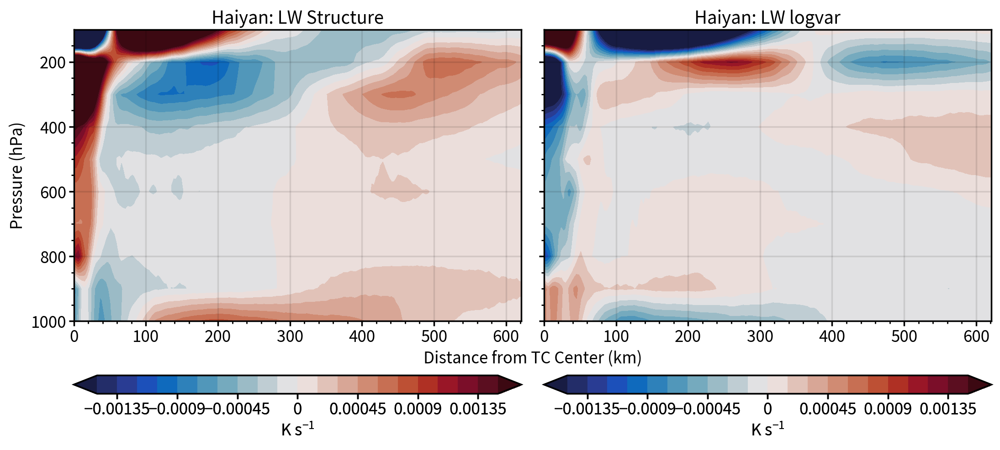

In [62]:
fig,axs = plot.subplots(ncols=2,nrows=1,axwidth=4.895,refaspect=1.531)
img = axs[0].contourf(np.linspace(0,207,208)*3,np.linspace(1000,100,10),np.mean(flas,axis=1),cmap='balance',levels=np.linspace(-1.5e-3,1.5e-3,21),extend='both')#vmin=-0.5e-5,vmax=0.5e-5)
axs[0].colorbar(img,loc='b',label='K s$^{-1}$')
axs[0].format(xlabel='Distance from TC Center (km)',ylabel='Pressure (hPa)',title='Haiyan: LW Structure')
img2 = axs[1].contourf(np.linspace(0,207,208)*3,np.linspace(1000,100,10),(np.mean(flas_logvar,axis=1)),cmap='balance',levels=np.linspace(-1.5e-3,1.5e-3,21),extend='both')
axs[1].colorbar(img2,loc='b',label='K s$^{-1}$')
axs[1].format(xlabel='Distance from TC Center (km)',ylabel='Pressure (hPa)',title='Haiyan: LW logvar')
#plt.savefig('./figures/optimstructures2D_revised_haiyan.png',dpi=600)
plt.show()

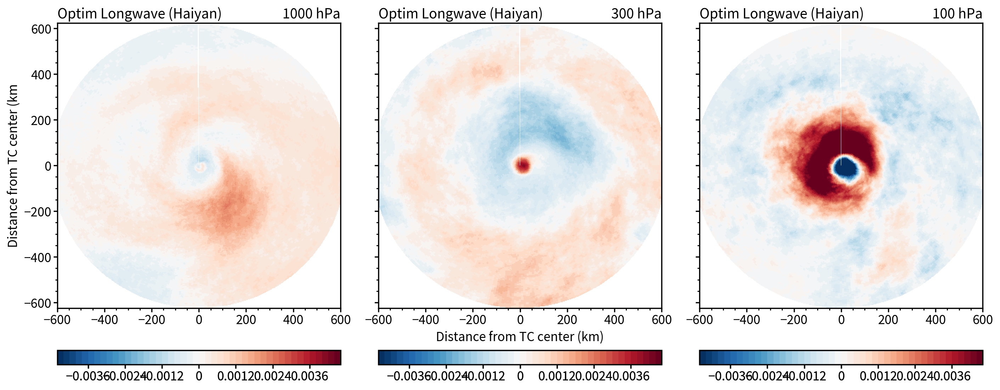

In [65]:
ANGLE = read_and_proc.azimuth2angle(np.linspace(0,359,360))
pressurelevel = [1000,300,100]
preslv = np.linspace(1000,100,10)
pressure_indx = [np.abs(preslv-obj).argmin() for obj in pressurelevel]

fig,axs = plot.subplots(ncols=3,nrows=1,axwidth=3.995,refaspect=0.9931)
for i,obj in enumerate(pressure_indx):
    #maps = axs[i].pcolormesh(np.ma.masked_inside(normalize(np.fliplr(np.flipud(read_and_proc.proc_tocart(optimLW[int(obj),...],ANGLE,True,False)))),-.65,.65),cmap='BuRd',vmin=-3,vmax=3)
    apl = (np.fliplr(np.flipud(read_and_proc.proc_tocart(np.asarray(flas)[obj,...],ANGLE,True,False))))
    values = (np.fliplr(np.flipud(read_and_proc.proc_tocart(np.asarray(flas)[obj,...],ANGLE,True,False))))[0,0]
    maps = axs[i].pcolormesh(np.linspace(-208,208,417)*3, np.linspace(-208,208,417)*3, np.ma.masked_where(apl==values,apl),cmap='BuRd',levels=np.linspace(-0.0046,0.0046,47))
    # hatches
    #stdd = np.nanstd(np.abs(np.asarray(test_toavg)[:,5,int(obj),...]))#,45)
    #aaaa = np.ma.masked_inside((np.fliplr(np.flipud(read_and_proc.proc_tocart(np.nanmean(np.asarray(test_toavg),axis=0)[5,int(obj),...],ANGLE,True,False)))),-stdd,stdd).mask
    #axs[i].contourf(aaaa.astype(int),levels=[0,0.5,1],hatches=["////","",""],alpha=0)
    # format
    axs[i].format(ltitle='Optim Longwave (Haiyan)',xlabel='Distance from TC center (km)', ylabel='Distance from TC center (km',rtitle=f'{pressurelevel[i]} hPa',xlim=[-600,600])
    axs[i].colorbar(maps,loc='b')
#plt.savefig('./figures/optimstructures3D_revised_haiyan.png',dpi=600)
plt.show()

# Old

In [11]:
bestdrop_indx = np.abs(np.asarray(droprates)-0.4).argmin()
bestmodel,best_dropout,modelnum,valsplit,storems = analysis_patterns(bestdrop_indx,droprates)._get_best_model(crps_store[0],40)
pcalw,pcasw = read_and_proc.depickle('./haiyan_store/pca/lw/'+str(valsplit)+'/PCA3D.pkg'),read_and_proc.depickle('./haiyan_store/pca/sw/'+str(valsplit)+'/PCA3D.pkg')
fl = analysis_patterns(bestdrop_indx,droprates).new_structure(store_notensor[valsplit]['train'][0],bestmodel,'LW')
flsw = analysis_patterns(bestdrop_indx,droprates).new_structure(store_notensor[valsplit]['train'][0],bestmodel,'SW')
flas = np.squeeze(np.dot(fl,pcalw['lw'].components_[:20,:])).reshape(10,360,208)
flas_sw = np.squeeze(np.dot(flsw,pcasw['sw'].components_[:20,:])).reshape(10,360,208)

In [28]:
pcastore = {'lw':pcalw['lw'],'sw':pcasw['sw']}
normpattern_LW,normpattern_SW,weightsstore = analysis_patterns(bestdrop_indx,droprates).get_MLdrop_structures(bestmodel,pcastore,True,[10,360,208],store_notensor,valsplit,'test')

NameError: name 'analysis' is not defined

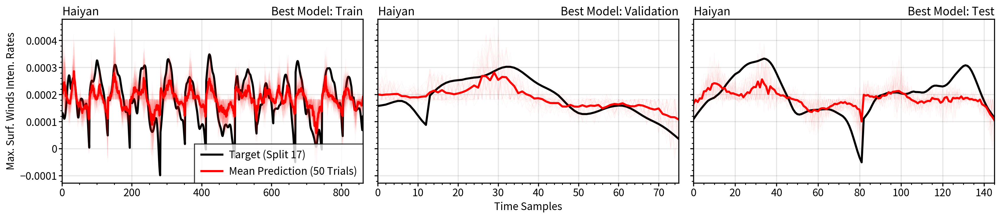

In [41]:
plot.rc.update({'axes.labelweight':'normal','tick.labelweight':'normal','figure.facecolor':'w','title.color':'k','fontname': 'Source Sans Pro', 'fontsize': 14.05,'linewidth':1.25})
plot.rc.axesfacecolor = 'w'

accesscode = 0.4
r2_performance = r2_store[0]
fig,axs = plot.subplots(ncols=3,nrows=1,axwidth=5.095,refaspect=1.831,sharey=3)
axs[0].plot(store_notensor[valsplit]['train'][1],label=f'Target (Split {valsplit})',c='k',lw=2.5)#79:132])
axs[0].plot(r2_store[0][accesscode][int(valsplit)]['meantrains'][int(modelnum)],label='Mean Prediction (50 Trials)',c='r',lw=2.5)#79:132])

allpreds = r2_store[0][accesscode][int(valsplit)]['alltrains'][int(modelnum)]
for pred in allpreds:
    axs[0].plot(pred,c='r',lw=0.35,alpha=0.05)
axs[0].legend(loc=4,ncols=1)
r2_scoress = r2_score(store_notensor[valsplit]['train'][1],r2_performance[accesscode][int(valsplit)]['meantrains'][int(modelnum)])
axs[0].format(xlabel='Time Samples',ylabel='Max. Surf. Winds Inten. Rates',ltitle='Haiyan',rtitle=f'Best Model: Train')

axs[1].plot(store_notensor[valsplit]['valid'][1],label=f'Target (Split {valsplit})',c='k',lw=2.5)#79:132])
axs[1].plot(r2_store[0][accesscode][int(valsplit)]['meanvals'][int(modelnum)],label='Mean Prediction (50 Trials)',c='r',lw=2.5)#79:132])
allpreds = r2_store[0][accesscode][int(valsplit)]['allvals'][int(modelnum)]
for pred in allpreds:
    axs[1].plot(pred,c='r',lw=0.35,alpha=0.05)
#r2_scoress = r2_score(y_toval,r2_performance[accesscode][int(valsplit)]['meanvals'][int(modelnum)])
axs[1].format(xlabel='Time Samples',ylabel='Max. Surf. Winds Inten. Rates',ltitle='Haiyan',rtitle=f'Best Model: Validation')#,rtitle='Optimal Longwave')
#plt.savefig('../analysis/pic/climateinfo/MCdropout_testskill_revised.png',dpi=600)

axs[2].plot(store_notensor[valsplit]['test'][1],label=f'Target (Split {valsplit})',c='k',lw=2.5)#79:132])
axs[2].plot(r2_store[0][accesscode][int(valsplit)]['meantests'][int(modelnum)],label='Mean Prediction (50 Trials)',c='r',lw=2.5)#79:132])
allpreds = r2_store[0][accesscode][int(valsplit)]['alltests'][int(modelnum)]
for pred in allpreds:
    axs[2].plot(pred,c='r',lw=0.35,alpha=0.05)
#r2_scoress = r2_score(y_totest,r2_performance[accesscode][int(valsplit)]['meantests'][int(modelnum)])
axs[2].format(xlabel='Time Samples',ylabel='Max. Surf. Winds Inten. Rates',ltitle='Haiyan',rtitle=f'Best Model: Test')#,rtitle='Optimal Longwave')

#axs[3].plot(store_notensor[valsplit]['test'][1],c='k',lw=2.5)
#axs[3].plot(r2_performance[accesscode][int(valsplit)]['meantests'][int(modelnum)],label='Mean Prediction (50 Trials)',c='r',lw=2.5)

#allpres = r2_performance[accesscode][int(valsplit)]['alltests'][int(modelnum)]
#for allpre in allpres:
#    axs[3].plot(allpre,label='Mean Prediction (50 Trials)',c='r',lw=0.15,alpha=0.22)
#axs[3].format(xlim=[0,82],title='Member 11') #xlim=[82,145]
plt.savefig('./figures/paper_si_haiyan_revised.png',dpi=600)
plt.show()

In [33]:
ALW = analysis_patterns(bestdrop_indx,droprates).new_coeff(store_notensor[valsplit]['train'][0],bestmodel,'LW',[-40,-20])
ASW = analysis_patterns(bestdrop_indx,droprates).new_coeff(store_notensor[valsplit]['train'][0],bestmodel,'SW',[-40,-20])
B = analysis_patterns(bestdrop_indx,droprates).new_b(store_notensor[valsplit]['train'][0],bestmodel,[-40,-20])

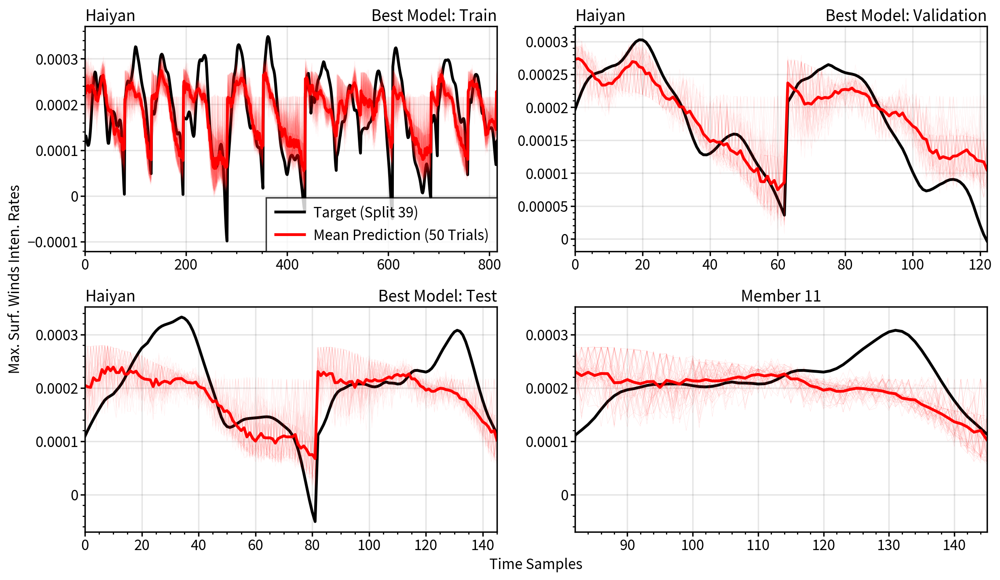

In [31]:
plot.rc.update({'axes.labelweight':'normal','tick.labelweight':'normal','figure.facecolor':'w','title.color':'k','fontname': 'Source Sans Pro', 'fontsize': 14.05,'linewidth':1.25})
plot.rc.axesfacecolor = 'w'

accesscode = 0.2
fig,axs = plot.subplots(ncols=2,nrows=2,axwidth=5.095,refaspect=1.831,share=1)
axs[0].plot(store_notensor[valsplit]['train'][1],label=f'Target (Split {valsplit})',c='k',lw=2.5)#79:132])
axs[0].plot(r2_performance[accesscode][int(valsplit)]['meantrains'][int(modelnum)],label='Mean Prediction (50 Trials)',c='r',lw=2.5)#79:132])

allpreds = r2_performance[accesscode][int(valsplit)]['alltrains'][int(modelnum)]
for pred in allpreds:
    axs[0].plot(pred,c='r',lw=0.35,alpha=0.05)
axs[0].legend(loc=4,ncols=1)
r2_scoress = r2_score(store_notensor[valsplit]['train'][1],r2_performance[accesscode][int(valsplit)]['meantrains'][int(modelnum)])
axs[0].format(xlabel='Time Samples',ylabel='Max. Surf. Winds Inten. Rates',ltitle='Haiyan',rtitle=f'Best Model: Train')

axs[1].plot(store_notensor[valsplit]['valid'][1],label=f'Target (Split {valsplit})',c='k',lw=2.5)#79:132])
axs[1].plot(r2_performance[accesscode][int(valsplit)]['meanvals'][int(modelnum)],label='Mean Prediction (50 Trials)',c='r',lw=2.5)#79:132])
allpreds = r2_performance[accesscode][int(valsplit)]['allvals'][int(modelnum)]
for pred in allpreds:
    axs[1].plot(pred,c='r',lw=0.35,alpha=0.05)
#r2_scoress = r2_score(y_toval,r2_performance[accesscode][int(valsplit)]['meanvals'][int(modelnum)])
axs[1].format(xlabel='Time Samples',ylabel='Max. Surf. Winds Inten. Rates',ltitle='Haiyan',rtitle=f'Best Model: Validation')#,rtitle='Optimal Longwave')
#plt.savefig('../analysis/pic/climateinfo/MCdropout_testskill_revised.png',dpi=600)

axs[2].plot(store_notensor[valsplit]['test'][1],label=f'Target (Split {valsplit})',c='k',lw=2.5)#79:132])
axs[2].plot(r2_performance[accesscode][int(valsplit)]['meantests'][int(modelnum)],label='Mean Prediction (50 Trials)',c='r',lw=2.5)#79:132])
allpreds = r2_performance[accesscode][int(valsplit)]['alltests'][int(modelnum)]
for pred in allpreds:
    axs[2].plot(pred,c='r',lw=0.35,alpha=0.05)
#r2_scoress = r2_score(y_totest,r2_performance[accesscode][int(valsplit)]['meantests'][int(modelnum)])
axs[2].format(xlabel='Time Samples',ylabel='Max. Surf. Winds Inten. Rates',ltitle='Haiyan',rtitle=f'Best Model: Test')#,rtitle='Optimal Longwave')

axs[3].plot(store_notensor[valsplit]['test'][1],c='k',lw=2.5)
axs[3].plot(r2_performance[accesscode][int(valsplit)]['meantests'][int(modelnum)],label='Mean Prediction (50 Trials)',c='r',lw=2.5)

allpres = r2_performance[accesscode][int(valsplit)]['alltests'][int(modelnum)]
for allpre in allpres:
    axs[3].plot(allpre,label='Mean Prediction (50 Trials)',c='r',lw=0.15,alpha=0.22)
axs[3].format(xlim=[82,145],title='Member 11') #xlim=[82,145]
#plt.savefig('./figures/paper_fig2_haiyan_revised.png',dpi=600)
plt.show()

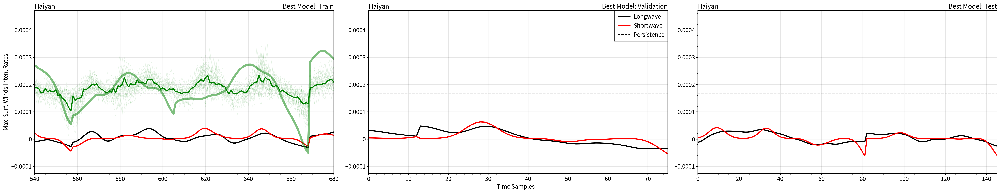

In [32]:
fig,axs = plot.subplots(ncols=3,nrows=1,axwidth=9.095,refaspect=1.831,share=2)
axs[0].plot(ALW*np.dot(np.asarray(store_notensor[valsplit]['train'][0])[:,-40:-20],fl),label='Longwave',c='k',lw=2.5)#79:132])
axs[0].plot(ASW*np.dot(np.asarray(store_notensor[valsplit]['train'][0])[:,-20:],flsw),label='Shortwave',c='r',lw=2.5)
axs[0].plot(r2_store[0][accesscode][int(valsplit)]['meantrains'][int(modelnum)],label='Mean Prediction (50 Trials)',c='g',lw=2.5)
axs[0].plot(store_notensor[valsplit]['train'][1],label=f'Target (Split {valsplit})',c='g',lw=4.5,alpha=0.5)
#axs[0].plot(bestmodel.train()(store_low[valsplit]['train'][0]).detach().numpy().transpose()[0],c='g',ls='--',lw=2.5,alpha=0.9)

allpreds = r2_performance[accesscode][int(valsplit)]['alltrains'][int(modelnum)]
for pred in allpreds:
    axs[0].plot(pred,c='g',lw=0.25,alpha=0.15)
    
axs[0].axhline(y=B,label='Persistence',c='k',lw=1.5,ls='--')
#axs[0].legend(loc=4,ncols=1)
axs[0].format(xlabel='Time Samples',ylabel=r'Max. Surf. Winds Inten. Rates',ltitle='Haiyan',rtitle=f'Best Model: Train',xlim=[540,680])

axs[1].plot(ALW*np.dot(np.asarray(store_notensor[valsplit]['valid'][0])[:,-40:-20],fl),label='Longwave',c='k',lw=2.5)#79:132])
axs[1].plot(ASW*np.dot(np.asarray(store_notensor[valsplit]['valid'][0])[:,-20:],flsw),label='Shortwave',c='r',lw=2.5)
axs[1].axhline(y=B,label='Persistence',c='k',lw=1.5,ls='--')
#r2_scoress = r2_score(y_toval,r2_performance[accesscode][int(valsplit)]['meanvals'][int(modelnum)])
axs[1].legend(loc=0,ncols=1)
axs[1].format(xlabel='Time Samples',ylabel=r'Max. Surf. Winds Inten. Rates',ltitle='Haiyan',rtitle=f'Best Model: Validation')#,rtitle='Optimal Longwave')
#plt.savefig('../analysis/pic/climateinfo/MCdropout_testskill_revised.png',dpi=600)

axs[2].plot(ALW*np.dot(np.asarray(store_notensor[valsplit]['test'][0])[:,-40:-20],fl),label='Longwave',c='k',lw=2.5)#79:132])
axs[2].plot(ASW*np.dot(np.asarray(store_notensor[valsplit]['test'][0])[:,-20:],flsw),label='Shortwave',c='r',lw=2.5)
axs[2].axhline(y=B,label='Persistence',c='k',lw=1.5,ls='--')
axs[2].format(xlabel='Time Samples',ylabel=r'Max. Surf. Winds Inten. Rates',ltitle='Haiyan',rtitle=f'Best Model: Test')#,rtitle='Optimal Longwave')
#plt.savefig('./figures/paper_suppl_haiyan_decomposed_inten.png',dpi=600)
plt.show()

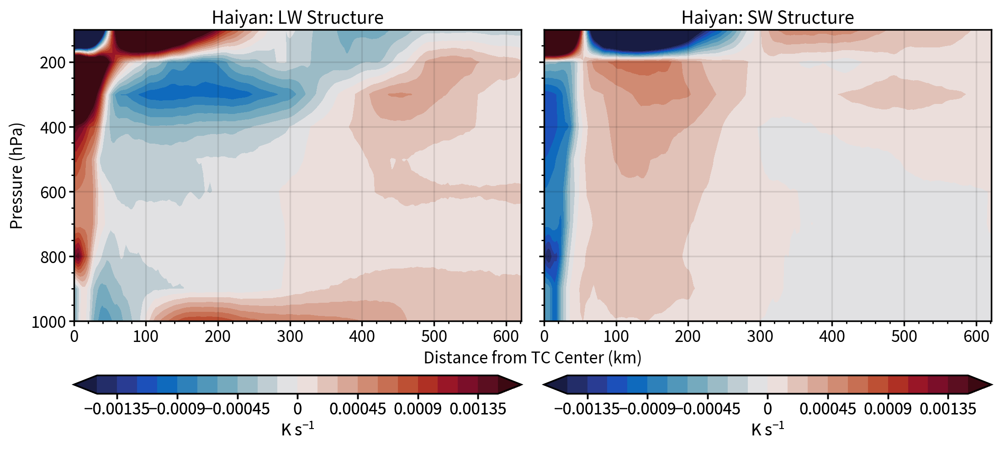

In [83]:
preslv = np.linspace(1000,100,10)
fig,axs = plot.subplots(ncols=2,nrows=1,axwidth=4.895,refaspect=1.531)
img = axs[0].contourf(np.linspace(0,flas.shape[2]-1,flas.shape[2])*3,(preslv),np.mean(flas,axis=1),cmap='balance',levels=np.linspace(-1.5e-3,1.5e-3,21),extend='both')#vmin=-0.5e-5,vmax=0.5e-5)
axs[0].colorbar(img,loc='b',label='K s$^{-1}$')
axs[0].format(xlabel='Distance from TC Center (km)',ylabel='Pressure (hPa)',title='Haiyan: LW Structure')
img2 = axs[1].contourf(np.linspace(0,flas.shape[2]-1,flas.shape[2])*3,(preslv),np.mean(flas_sw,axis=1),cmap='balance',levels=np.linspace(-1.5e-3,1.5e-3,21),extend='both')
axs[1].colorbar(img2,loc='b',label='K s$^{-1}$')
axs[1].format(xlabel='Distance from TC Center (km)',ylabel='Pressure (hPa)',title='Haiyan: SW Structure')
plt.savefig('./figures/optimstructures2D_revised_haiyan.png',dpi=600)
plt.show()

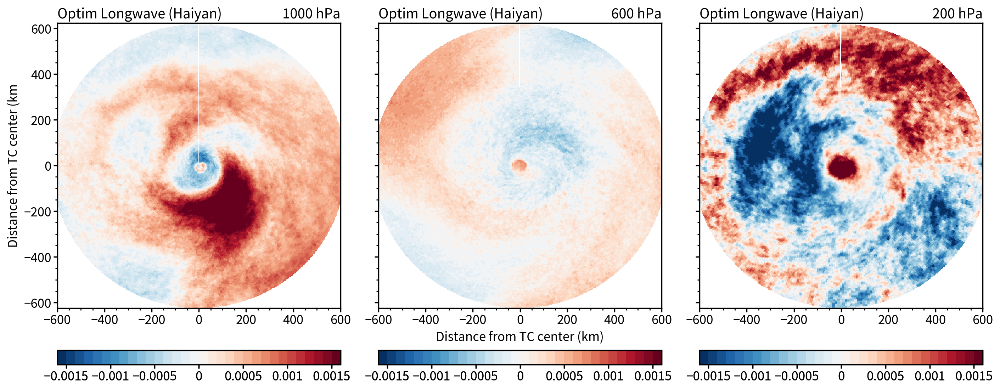

In [84]:
ANGLE = read_and_proc.azimuth2angle(np.linspace(0,359,360))
pressurelevel = [1000,600,200]
pressure_indx = [np.abs(preslv-obj).argmin() for obj in pressurelevel]

fig,axs = plot.subplots(ncols=3,nrows=1,axwidth=3.995,refaspect=0.9931)
for i,obj in enumerate(pressure_indx):
    #maps = axs[i].pcolormesh(np.ma.masked_inside(normalize(np.fliplr(np.flipud(read_and_proc.proc_tocart(optimLW[int(obj),...],ANGLE,True,False)))),-.65,.65),cmap='BuRd',vmin=-3,vmax=3)
    apl = (np.fliplr(np.flipud(read_and_proc.proc_tocart(np.asarray(flas)[obj,...],ANGLE,True,False))))
    values = (np.fliplr(np.flipud(read_and_proc.proc_tocart(np.asarray(flas)[obj,...],ANGLE,True,False))))[0,0]
    maps = axs[i].pcolormesh(np.linspace(-208,208,417)*3, np.linspace(-208,208,417)*3, np.ma.masked_where(apl==values,apl),cmap='BuRd',levels=np.linspace(-0.0016,0.0016,33))
    # hatches
    #stdd = np.nanstd(np.abs(np.asarray(test_toavg)[:,5,int(obj),...]))#,45)
    #aaaa = np.ma.masked_inside((np.fliplr(np.flipud(read_and_proc.proc_tocart(np.nanmean(np.asarray(test_toavg),axis=0)[5,int(obj),...],ANGLE,True,False)))),-stdd,stdd).mask
    #axs[i].contourf(aaaa.astype(int),levels=[0,0.5,1],hatches=["////","",""],alpha=0)
    # format
    axs[i].format(ltitle='Optim Longwave (Haiyan)',xlabel='Distance from TC center (km)', ylabel='Distance from TC center (km',rtitle=f'{pressurelevel[i]} hPa',xlim=[-600,600])
    axs[i].colorbar(maps,loc='b')
plt.savefig('./figures/optimstructures3D_revised_haiyan.png',dpi=600)
plt.show()

In [86]:
calc_device='cpu'
class OptimMLR_lwsw_3D_ts_dropout_small_dropemulate(torch.nn.Module):
    def __init__(self,droprate,brchindices):
        #super(OptimMLR_all_2D, self).__init__()
        super(OptimMLR_lwsw_3D_ts_dropout_small_dropemulate, self).__init__()
        self.brchindices = brchindices
        ############################################################
        # Input channels
        ############################################################
        brchsize = self.brchindices[-2:]#[50,38,91,8,82,20,20]
        self.dense1 = torch.nn.Linear(brchsize[0], 1)
        self.dense2 = torch.nn.Linear(brchsize[1], 1)
        self.dropout1 = torch.nn.Dropout(droprate)
        self.dropout2 = torch.nn.Dropout(droprate)
        
    def forward(self,X):
        brchindex = list(np.asarray(self.brchindices).cumsum())
        X_u, X_v, X_w, X_th = X[:,brchindex[0]:brchindex[1]],X[:,brchindex[1]:brchindex[2]],X[:,brchindex[2]:brchindex[3]],X[:,brchindex[3]:brchindex[4]]
        X_hdia, X_lw, X_sw = X[:,brchindex[4]:brchindex[5]],X[:,brchindex[5]:brchindex[6]],X[:,brchindex[6]:brchindex[7]]
        ############################################################
        # Optimal PC layer
        ############################################################
        X_lwc = self.dropout1(X_lw)
        #bestlw = self.dense1(X_lwc)
        X_swc = self.dropout2(X_sw)
        #bestsw = self.dense2(X_swc)
        return X_lwc,X_swc

from copy import deepcopy
def get_MLdrop_structures(bestmodel=None,pcastore=None,standard=True,shape3D=[10,360,208],Xtest=None,ytest=None,dropout=0.1,brchindex=[0,50,38,50,8,50,20,20],compnums=[10,10]):
    # First Model
    model = OptimMLR_lwsw_3D_ts_dropout_small_dropemulate(dropout,brchindex)
    model_dict = model.state_dict()
    pretrained_dict = bestmodel.state_dict()
    pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict}
    model_dict.update(pretrained_dict)
    model.load_state_dict(model_dict)
    
    test_Xtensor = torch.FloatTensor(Xtest).to(calc_device)
    test_ytensor = torch.FloatTensor(ytest).to(calc_device)
    lwdrop,swdrop = model.train()(test_Xtensor)
    lwdrop,swdrop = lwdrop.detach().numpy(),swdrop.detach().numpy()
    weights = benchmark.model_outweights(model)
    
    normpattern_SW,normpattern_LW,weightsstore = [],[],[]
    for i in range(len(lwdrop)):
        LWweights = deepcopy(weights[0][0].detach().numpy())
        SWweights = deepcopy(weights[0][1].detach().numpy())
        LW_zeroindices,SW_zeroindices = list(np.where(lwdrop[i,...]==0)[0]),list(np.where(swdrop[i,...]==0)[0])
        np.put(LWweights,LW_zeroindices,[0 for _ in range(len(LW_zeroindices))])
        np.put(SWweights,SW_zeroindices,[0 for _ in range(len(SW_zeroindices))])
        weightsstore.append({'LW':LWweights,'SW':SWweights})
        
        if standard:
            TEST_LW = (LWweights)/((np.sqrt(np.sum(LWweights**2))))
            TEST_SW = (SWweights)/((np.sqrt(np.sum(SWweights**2))))
            normpattern_SW.append(np.squeeze(np.dot(TEST_SW,pcastore['sw'].components_[:compnums[0],:])).reshape(shape3D[0],shape3D[1],shape3D[2]))
            normpattern_LW.append(np.squeeze(np.dot(TEST_LW,pcastore['lw'].components_[:compnums[1],:])).reshape(shape3D[0],shape3D[1],shape3D[2]))
    return normpattern_LW,normpattern_SW,weightsstore

In [87]:
LWstructures,SWstructures = [], []#, SWstructures, weightss = [],[],[]
for _ in tqdm(range(20)):
    a,b,c = get_MLdrop_structures(bestmodel,{'lw':pcalw['lw'],'sw':pcasw['sw']},True,[10,360,208],store_notensor[valsplit]['train'][0],store_notensor[valsplit]['train'][1],0.1,[0,50,38,50,8,50,20,20],[20,20])
    LWstructures.append(a)
    SWstructures.append(b)
    #weightss.append(c)
del a,b,c
gc.collect()

  0%|          | 0/20 [00:00<?, ?it/s]

1240282

In [92]:
#del numnum
#gc.collect()
pressurelevel = [1000,600,200]
pressure_indx = [np.abs(np.linspace(1000,100,10)-obj).argmin() for obj in pressurelevel]
numnum = [np.asarray(LWstructures[i])[140,pressure_indx[2],...] for i in range(20)]
ANGLE=read_and_proc.azimuth2angle(np.linspace(0,359,360))

In [95]:
std_store = []
for j in tqdm(range(10)):
    std_store.append(np.mean(np.std(np.asarray([np.asarray(LWstructures[i])[140,j,...] for i in range(20)])[:],axis=0),axis=0))

  0%|          | 0/10 [00:00<?, ?it/s]

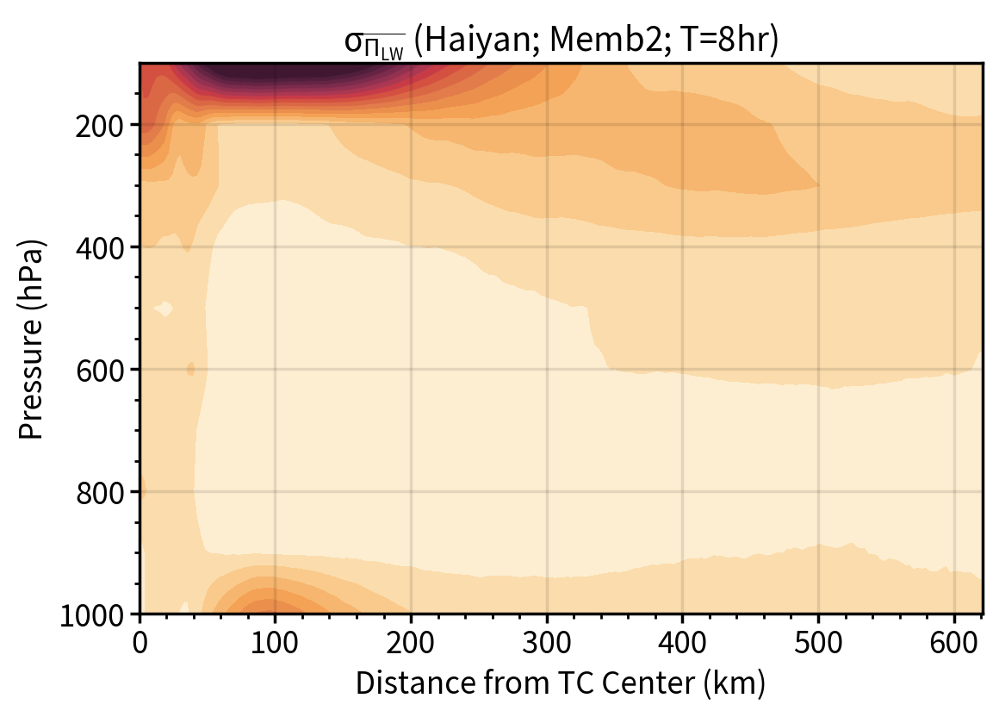

In [104]:
fig,axs = plot.subplots(ncols=1,nrows=1,axwidth=4.895,refaspect=1.531)
img = axs[0].contourf(np.linspace(0,flas.shape[2]-1,flas.shape[2])*3,(preslv),np.asarray(std_store),levels=np.linspace(0,0.0015,16),extend='both')
axs[0].format(xlabel='Distance from TC Center (km)',ylabel='Pressure (hPa)',title='$\sigma_{\overline{\Pi_{LW}}}$ (Haiyan; Memb2; T=8hr)')
plt.show()

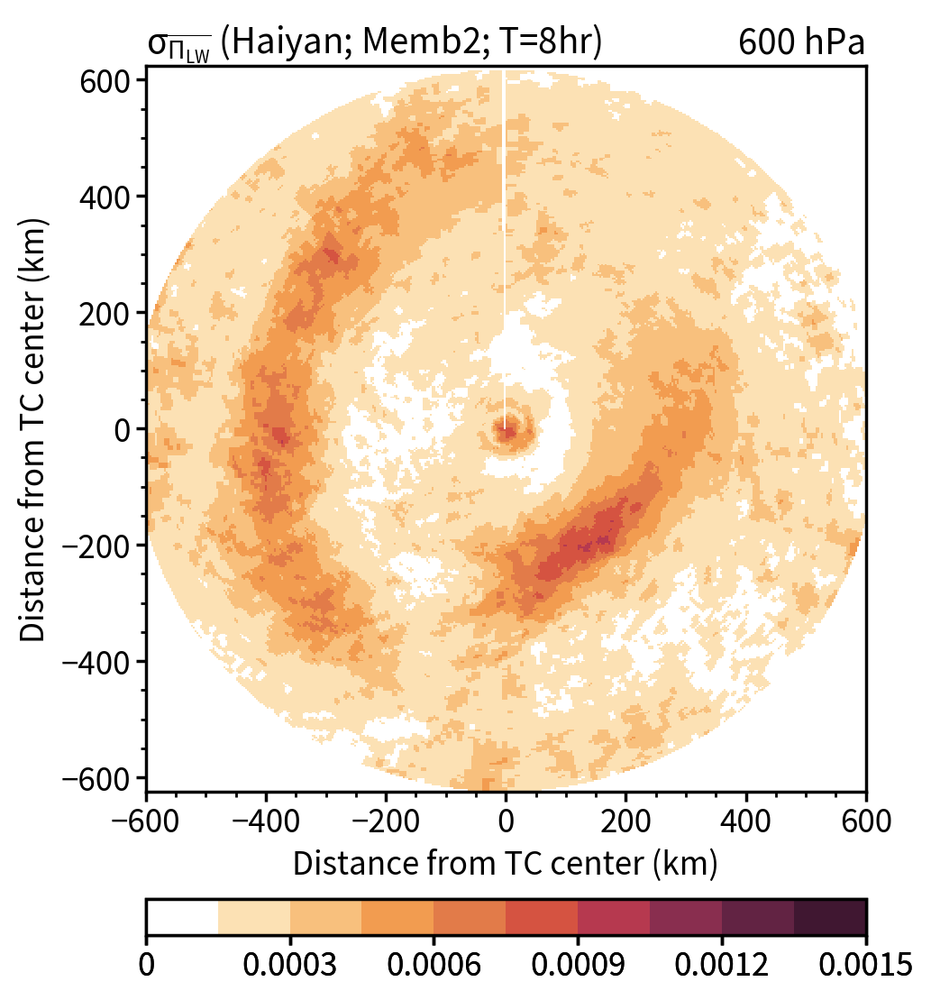

In [105]:
fig,axs = plot.subplots(ncols=1,nrows=1,axwidth=3.995,refaspect=0.9931)
amg = axs.pcolormesh(np.linspace(-208,208,417)*3, np.linspace(-208,208,417)*3,(np.fliplr(np.flipud(read_and_proc.proc_tocart(np.std(np.asarray(numnum)[:],axis=0),ANGLE,True,False)))),cmap='Fire',vmin=0,vmax=0.0015)
#axs.plot(np.linspace(0,82,83)*3, np.linspace(0,82,83)*3*np.tan(-(154.89-90)*(2*np.pi/360)), lw=2, c='k')
#axs.plot(np.linspace(0,180,180)*3, np.linspace(0,180,180)*3*np.tan(25*(2*np.pi/360)), lw=2, c='k')
axs.format(ltitle='$\sigma_{\overline{\Pi_{LW}}}$ (Haiyan; Memb2; T=8hr)',xlabel='Distance from TC center (km)', ylabel='Distance from TC center (km)',rtitle=f'{pressurelevel[1]} hPa',xlim=[-600,600])
axs.colorbar(amg,loc='b')
#plt.savefig('./figures/optimLW_std_600_T60.png',dpi=600)
plt.show()

In [14]:
import analysis
haiyan_u = [read_and_proc.depickle(path+'TCGphy/2020_TC_CRF/dev/freddy0218/testML/output/haiyan/processed/uvwheat/'+'mem'+str(lime)+suffix)['u'].shape for lime in tqdm(range(1,21))]
haiyan_v = [read_and_proc.depickle(path+'TCGphy/2020_TC_CRF/dev/freddy0218/testML/output/haiyan/processed/uvwheat/'+'mem'+str(lime)+suffix)['v'].shape for lime in tqdm(range(1,21))]

path = '/work/FAC/FGSE/IDYST/tbeucler/default/freddy0218/'
suffix = '_smooth_preproc_dict1b_g'
suffixRAD = '_smooth_preproc_dict1b_g_radcomp'
haiyan_lw = [read_and_proc.depickle(path+'TCGphy/2020_TC_CRF/dev/freddy0218/testML/output/haiyan/processed/uvwheat/radcomp/'+'mem'+str(lime)+suffixRAD)['LW'] for lime in tqdm(range(1,21))]
haiyan_sw = [read_and_proc.depickle(path+'TCGphy/2020_TC_CRF/dev/freddy0218/testML/output/haiyan/processed/uvwheat/radcomp/'+'mem'+str(lime)+suffixRAD)['SW'] for lime in tqdm(range(1,21))]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

In [15]:
folderpath='/work/FAC/FGSE/IDYST/tbeucler/default/freddy0218/TCGphy/2020_TC_CRF/dev/freddy0218/TCG_Rad_keras/store/'
folderpath2='/work/FAC/FGSE/IDYST/tbeucler/default/freddy0218/TCGphy/2020_TC_CRF/dev/freddy0218/testML/output/haiyan/processed/new3D/'
so = []
for index in range(40):
    so.append(read._get_exp_name(folderpath2,index,'rhorig','fixTEST')[1])

In [16]:
import preproc
aaaaa = preproc.train_valid_test(haiyan_lw,[int(so[valsplit][0]),int(so[valsplit][1])],[int(so[valsplit][2]),int(so[valsplit][3])],'Yes')

In [118]:
MEANLW = np.mean(np.mean(aaaaa[0],axis=0).reshape(10,360,208),axis=1)

In [119]:
ins = [int(obj) for obj in so[valsplit]]

In [120]:
np.abs((np.asarray([aobj.shape[0]-24 for aindx,aobj in enumerate(haiyan_lw) if aindx not in ins])).cumsum()-140).argmin()

1

In [121]:
(np.asarray([aobj.shape[0]-24 for aindx,aobj in enumerate(haiyan_lw) if aindx not in ins])).cumsum(),[aindx for aindx,aobj in enumerate(haiyan_lw) if aindx not in ins]

(array([ 79, 132, 195, 282, 353, 413, 496, 507, 515, 558, 606, 669, 745,
        805, 861, 863]),
 [0, 1, 2, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 18, 19])

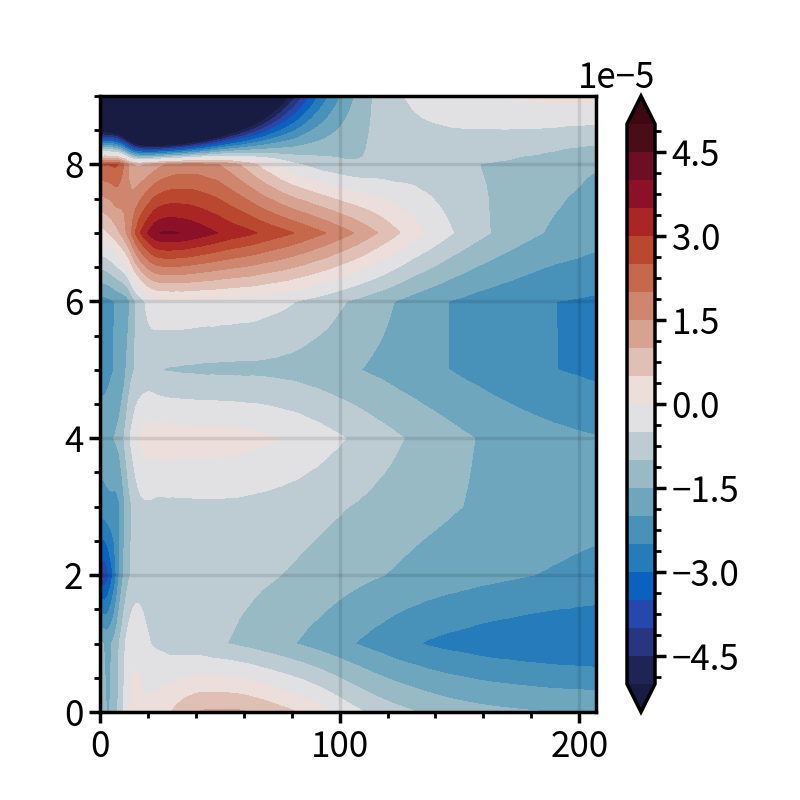

In [128]:
plt.contourf(MEANLW,cmap='balance',levels=np.linspace(-0.5e-4,0.5e-4,21),extend='both')
plt.colorbar()
plt.show()

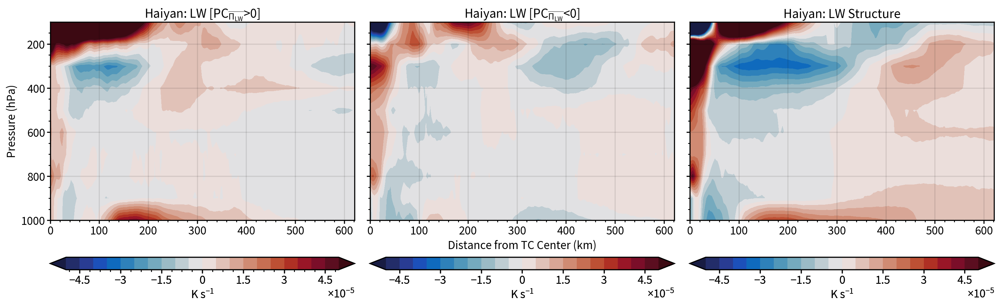

In [124]:
preslv = np.linspace(1000,100,10)
fig,axs = plot.subplots(ncols=3,nrows=1,axwidth=4.895,refaspect=1.531)
img = axs[0].contourf(np.linspace(0,flas.shape[2]-1,flas.shape[2])*3,(preslv),np.mean(haiyan_lw[2][140-132].reshape(10,360,208),axis=1)-MEANLW,cmap='balance',levels=np.linspace(-0.5e-4,0.5e-4,21),extend='both')#vmin=-0.5e-5,vmax=0.5e-5)
axs[0].colorbar(img,loc='b',label='K s$^{-1}$')
axs[0].format(xlabel='Distance from TC Center (km)',ylabel='Pressure (hPa)',title='Haiyan: LW [$PC_{\overline{\Pi_{LW}}}$>0]')
#img2 = axs[1].contourf(np.linspace(0,flas.shape[2]-1,flas.shape[2])*3,(preslv),np.mean(haiyan_lw[0][23].reshape(10,360,208),axis=1),cmap='balance',levels=np.linspace(-0.5e-4,0.5e-4,21),extend='both')
img2 = axs[1].contourf(np.linspace(0,flas.shape[2]-1,flas.shape[2])*3,(preslv),np.mean(haiyan_lw[11][575-558].reshape(10,360,208),axis=1)-MEANLW,cmap='balance',levels=np.linspace(-0.5e-4,0.5e-4,21),extend='both')
#axs[1].contour(np.linspace(0,flas.shape[2]-1,flas.shape[2])*3,(preslv),np.mean(flas,axis=1),levels=np.linspace(-2e-3,2e-3,11),extend='both',color='yellow')
axs[1].colorbar(img2,loc='b',label='K s$^{-1}$')
axs[1].format(xlabel='Distance from TC Center (km)',ylabel='Pressure (hPa)',title='Haiyan: LW [$PC_{\overline{\Pi_{LW}}}$<0]')
axs[2].contourf(np.linspace(0,flas.shape[2]-1,flas.shape[2])*3,(preslv),np.mean(flas,axis=1),cmap='balance',levels=np.linspace(-1.5e-3,1.5e-3,21),extend='both')#vmin=-0.5e-5,vmax=0.5e-5)
axs[2].colorbar(img,loc='b',label='K s$^{-1}$')
axs[2].format(xlabel='Distance from TC Center (km)',ylabel='Pressure (hPa)',title='Haiyan: LW Structure')
plt.savefig('./figures/LWstructures2D_revised_haiyan_sample.png',dpi=600)
plt.show()

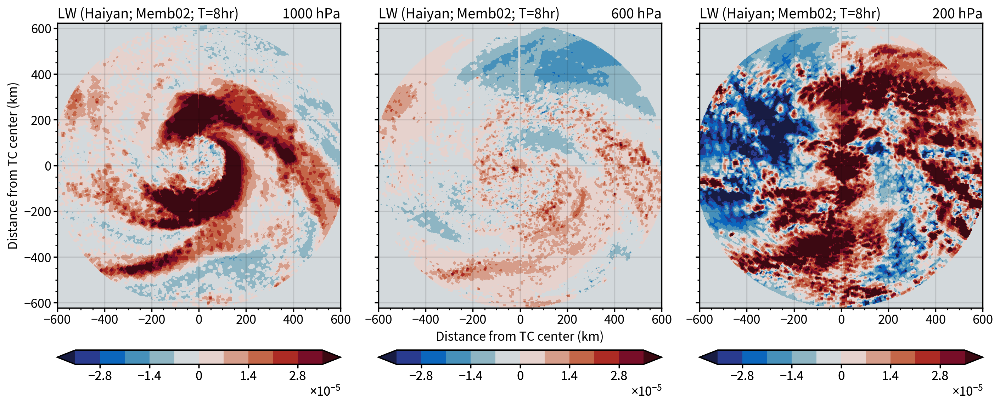

In [125]:
fig,axs = plot.subplots(ncols=3,nrows=1,axwidth=3.995,refaspect=0.9931)
for i in range(3):
    #amg = axs[i].pcolormesh(np.linspace(-208,208,417)*3, np.linspace(-208,208,417)*3,(np.fliplr(np.flipud(read_and_proc.proc_tocart(haiyan_lw[2][150-132].reshape(10,360,208)[pressure_indx[i]],ANGLE,True,False)))),
    #                        cmap='RdBu_r',vmin=-0.000035,vmax=0.000035)
    amg = axs[i].contourf(np.linspace(-208,208,417)*3, np.linspace(-208,208,417)*3,(np.fliplr(np.flipud(read_and_proc.proc_tocart((haiyan_lw[2][140-132].reshape(10,360,208)[pressure_indx[i]]-
                                                                                                                                  np.mean(aaaaa[0],axis=0).reshape(10,360,208)[pressure_indx[i]]),
                                                                                                                                  ANGLE,True,False)))),
                            cmap='balance',levels=np.linspace(-0.000035,0.000035,11),extend='both')#vmin=-0.000035,vmax=0.000035)
    axs[i].colorbar(amg,loc='b')
    axs[i].format(ltitle='LW (Haiyan; Memb02; T=8hr)',xlabel='Distance from TC center (km)', ylabel='Distance from TC center (km)',rtitle=f'{pressurelevel[i]} hPa',xlim=[-600,600])
#apl = (np.fliplr(np.flipud(read_and_proc.proc_tocart(np.asarray(flas)[pressure_indx[1],...],ANGLE,True,False))))
#values = (np.fliplr(np.flipud(read_and_proc.proc_tocart(np.asarray(flas)[pressure_indx[1],...],ANGLE,True,False))))[0,0]
#axs[1].contour(np.linspace(-208,208,417)*3, np.linspace(-208,208,417)*3, np.ma.masked_where(gaussian_filter(apl,1.7)==values,gaussian_filter(apl,2.7)),c='yellow',levels=np.linspace(-0.0004,0.0004,5),lw=0.8)

#plt.savefig('./figures/Haiyan_LW_case1.png',dpi=600)
plt.show()

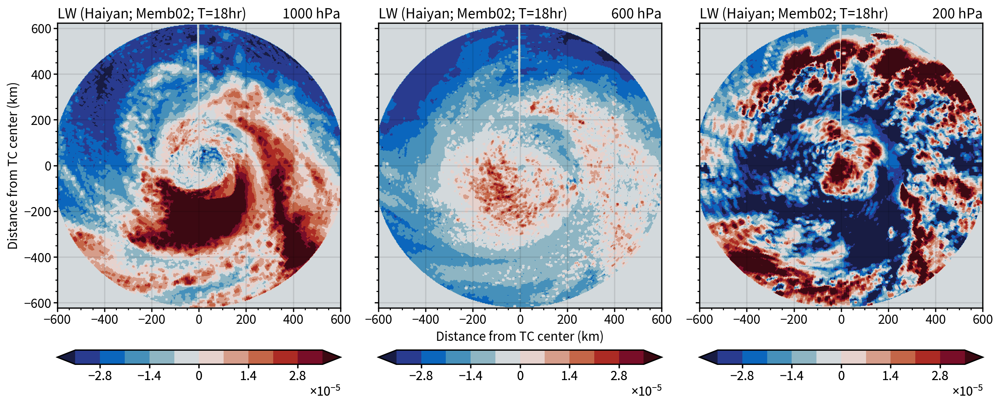

In [76]:
fig,axs = plot.subplots(ncols=3,nrows=1,axwidth=3.995,refaspect=0.9931)
for i in range(3):
    #amg = axs[i].pcolormesh(np.linspace(-208,208,417)*3, np.linspace(-208,208,417)*3,(np.fliplr(np.flipud(read_and_proc.proc_tocart(haiyan_lw[2][150-132].reshape(10,360,208)[pressure_indx[i]],ANGLE,True,False)))),
    #                        cmap='RdBu_r',vmin=-0.000035,vmax=0.000035)
    amg = axs[i].contourf(np.linspace(-208,208,417)*3, np.linspace(-208,208,417)*3,(np.fliplr(np.flipud(read_and_proc.proc_tocart(haiyan_lw[2][150-132].reshape(10,360,208)[pressure_indx[i]],ANGLE,True,False)))),
                            cmap='balance',levels=np.linspace(-0.000035,0.000035,11),extend='both')#vmin=-0.000035,vmax=0.000035)
    axs[i].colorbar(amg,loc='b')
    axs[i].format(ltitle='LW (Haiyan; Memb02; T=18hr)',xlabel='Distance from TC center (km)', ylabel='Distance from TC center (km)',rtitle=f'{pressurelevel[i]} hPa',xlim=[-600,600])
plt.savefig('./figures/Haiyan_LW_case1b.png',dpi=600)
plt.show()

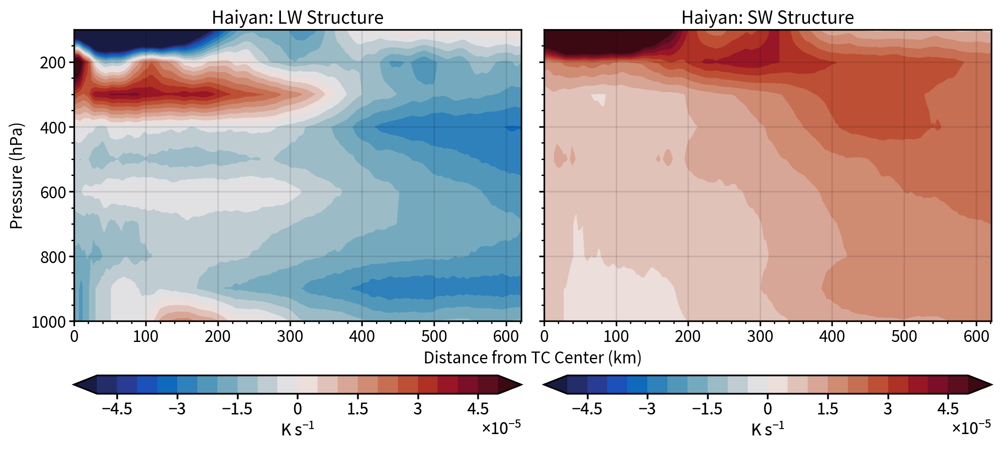

In [44]:
preslv = np.linspace(1000,100,10)
fig,axs = plot.subplots(ncols=2,nrows=1,axwidth=4.895,refaspect=1.531)
img = axs[0].contourf(np.linspace(0,flas.shape[2]-1,flas.shape[2])*3,(preslv),np.mean(haiyan_lw[11][580-558].reshape(10,360,208),axis=1),cmap='balance',levels=np.linspace(-0.5e-4,0.5e-4,21),extend='both')#vmin=-0.5e-5,vmax=0.5e-5)
axs[0].colorbar(img,loc='b',label='K s$^{-1}$')
axs[0].format(xlabel='Distance from TC Center (km)',ylabel='Pressure (hPa)',title='Haiyan: LW Structure')
img2 = axs[1].contourf(np.linspace(0,flas.shape[2]-1,flas.shape[2])*3,(preslv),np.mean(haiyan_sw[11][580-558].reshape(10,360,208),axis=1),cmap='balance',levels=np.linspace(-0.5e-4,0.5e-4,21),extend='both')
axs[1].colorbar(img2,loc='b',label='K s$^{-1}$')
axs[1].format(xlabel='Distance from TC Center (km)',ylabel='Pressure (hPa)',title='Haiyan: SW Structure')
#plt.savefig('./figures/optimstructures2D_revised_haiyan.png',dpi=600)
plt.show()

In [63]:
from scipy.ndimage.filters import gaussian_filter

In [100]:
from metpy.calc import wind_direction
from metpy.units import units
du,dv = haiyan_u[2][140-132].reshape(10,360,208)[8,...]-haiyan_u[2][140-132].reshape(10,360,208)[2,...], haiyan_v[2][140-132].reshape(10,360,208)[8,...]-haiyan_v[2][140-132].reshape(10,360,208)[2,...]
dus,dvs = np.nanmean(du[...,67:]),np.nanmean(dv[...,67:])
print(float(wind_direction(dus*units('m/s'), dvs*units('m/s'), convention='to').magnitude))

137.38201210772573


## Input Perturbation

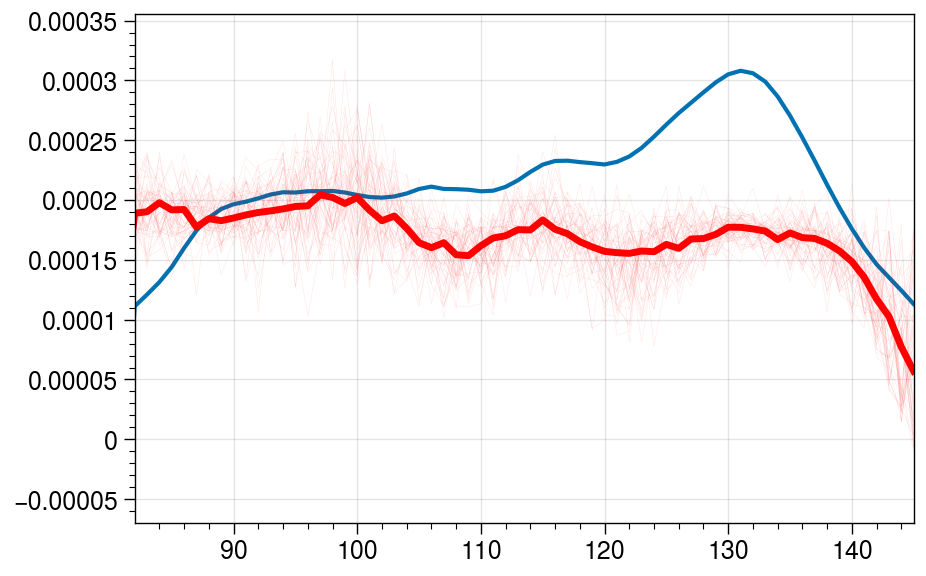

In [39]:
accesscode = 0.2
fig,axs = plot.subplots(ncols=1,nrows=1,axwidth=3.895,refaspect=1.531)
axs[0].plot(store_notensor[valsplit]['test'][1])
axs[0].plot(r2_performance[accesscode][int(valsplit)]['meantests'][int(modelnum)],label='Mean Prediction (50 Trials)',c='r',lw=2.5)

allpres = r2_performance[accesscode][int(valsplit)]['alltests'][int(modelnum)]
for allpre in allpres:
    axs[0].plot(allpre,label='Mean Prediction (50 Trials)',c='r',lw=0.15,alpha=0.12)
axs[0].format(xlim=[82,145])
#plt.xlim(82,145)
plt.show()

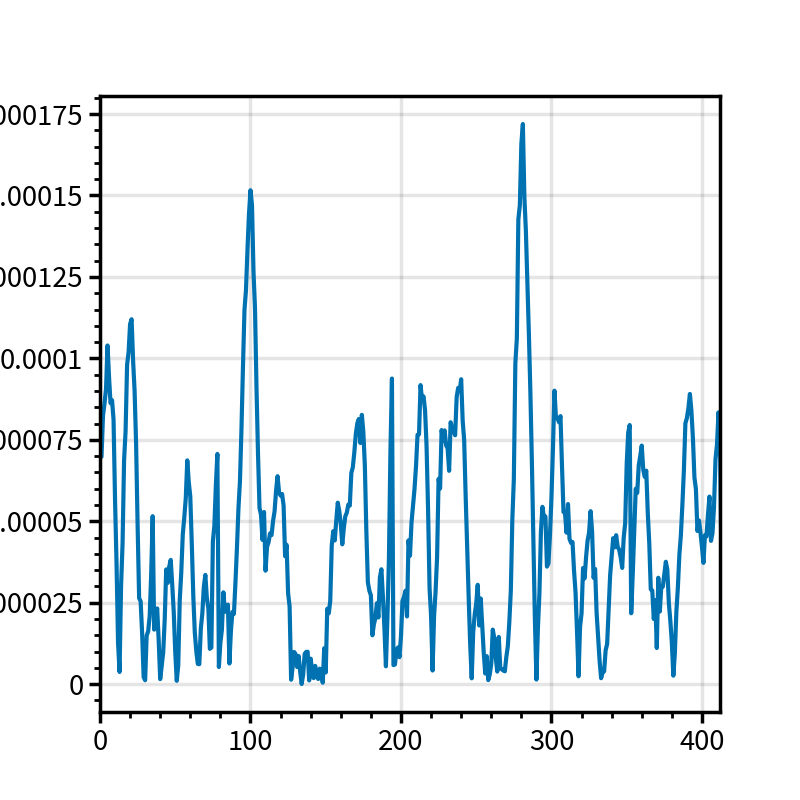

In [169]:
error = np.abs(r2_performance[accesscode][int(valsplit)]['meantrains'][int(modelnum)]-store_notensor[valsplit]['train'][1])
#plt.plot(np.std(np.asarray(allpres),axis=0))
plt.plot(error)
plt.xlim(0,412)
plt.show()

In [67]:
folderpath='/work/FAC/FGSE/IDYST/tbeucler/default/freddy0218/TCGphy/2020_TC_CRF/dev/freddy0218/TCG_Rad_keras/store/'
folderpath2='/work/FAC/FGSE/IDYST/tbeucler/default/freddy0218/TCGphy/2020_TC_CRF/dev/freddy0218/testML/output/haiyan/processed/new3D/'
read.train_optimizedMLR(folderpath,folderpath2,'rhorig','rhorig','3D').where_exp_MLRpred(divider=divider,num=40,expnum=2,LT=24)

,start,end,exp,size
0,132,195,train,63
1,132,195,train,63
2,132,195,train,63
3,132,195,train,63
4,132,195,train,63
5,132,195,train,63
6,132,195,train,63
7,132,195,train,63
8,132,195,train,63
9,132,195,train,63


In [72]:
storeLOCS = []
for i in tqdm(range(20)):
    storeLOCS.append(read.train_optimizedMLR(folderpath,folderpath2,'rhorig','rhorig','3D').where_exp_MLRpred(divider=divider,num=40,expnum=i,LT=24).iloc[valsplit])

  0%|          | 0/20 [00:00<?, ?it/s]

In [90]:
exp,start,end = [obj['exp'] for obj in storeLOCS],[obj['start'] for obj in storeLOCS],[obj['end'] for obj in storeLOCS]

In [193]:
exp

['train',
 'train',
 'train',
 'train',
 'train',
 'train',
 'train',
 'valid',
 'train',
 'train',
 'test',
 'train',
 'train',
 'train',
 'train',
 'valid',
 'train',
 'test',
 'train',
 'train']

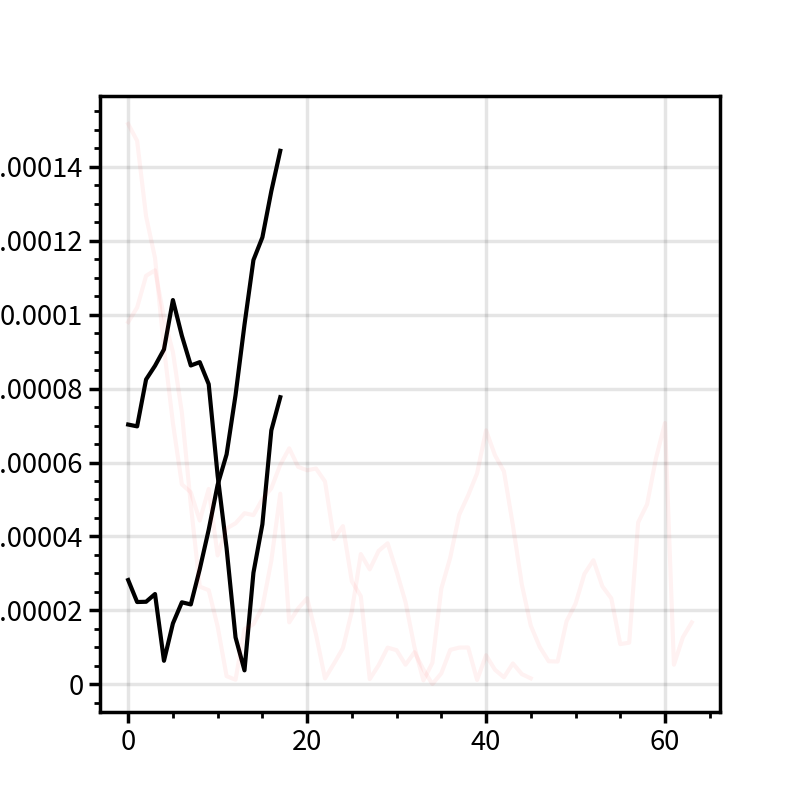

In [184]:
for i in error_early:
    plt.plot(i,c='k')
for j in error_later:
    plt.plot(j,c='r',alpha=0.05)
plt.show()

In [185]:
error = np.abs(r2_performance[accesscode][int(valsplit)]['meantests'][int(modelnum)]-store_notensor[valsplit]['test'][1])
error_early,error_later = [],[]
for i in range(20):
    if exp[i]=='test':
        if i==0:
            error_early.append(error[0:18])
            error_later.append(error[18:79])
        if end[i]-start[i]<24:
            continue
        else:
            print(start[i],end[i])
            error_early.append(error[start[i]:start[i]+18])
            error_later.append(error[start[i]+18:end[i]])
    else:
        continue

0 82
82 146


In [186]:
from scipy.stats import kstest,ttest_ind

In [187]:
ttest_ind(np.asarray(read_and_proc.flatten(error_early)),np.asarray(read_and_proc.flatten(error_later)))

Ttest_indResult(statistic=-4.740820487518183, pvalue=5.062751434553933e-06)

In [188]:
np.mean(read_and_proc.flatten(error_early)),np.percentile(read_and_proc.flatten(error_early),25),np.percentile(read_and_proc.flatten(error_early),50),np.percentile(read_and_proc.flatten(error_early),75)

(2.939562405959738e-05,
 1.1389340248165853e-05,
 2.9880266423181943e-05,
 4.339939798228441e-05)

In [189]:
np.mean(read_and_proc.flatten(error_later)),np.percentile(read_and_proc.flatten(error_later),25),np.percentile(read_and_proc.flatten(error_later),50),np.percentile(read_and_proc.flatten(error_later),75)

(6.0586718341056586e-05,
 2.8729863403929843e-05,
 5.26261735272042e-05,
 9.124729428246308e-05)

In [11]:
from copy import deepcopy
class best_inputpert:
    def __init__(self,bestmodel=None,X_totrain=None,y_totrain=None,X_toval=None,y_toval=None,X_totest=None,y_totest=None):
        self.bestmodel=bestmodel
        self.X_totrain = deepcopy(X_totrain)
        self.y_totrain = deepcopy(y_totrain)
        self.X_toval = deepcopy(X_toval)
        self.y_toval = deepcopy(y_toval)
        self.X_totest = deepcopy(X_totest)
        self.y_totest = deepcopy(y_totest)

        
    def get_perturbweight(self,mean=0,sigma=1,totalnum=309,radnum=40,seed=42):
        setup_seed(seed)
        mus = []
        for t in range(totalnum):
            if t>=totalnum-radnum:
                mus.append(random.gauss(mean,sigma))
            else:
                mus.append(1)
        return mus

    def multiply(self,inputt=None,weights=None):
        store = []
        for i in range(len(inputt)):
            store.append(np.asarray(inputt[i])*weights)
        return store
        
    def get_perturbedinput(self,mean=0,sigma=1,totalnum=309,radnum=40,seed=42):
        setup_seed(seed)
        weights = self.get_perturbweight(mean,sigma,totalnum,radnum,seed)
        
        Xtrain = self.multiply(self.X_totrain,weights)#[weightt*Xtrainn for Xtrainn,weightt in zip(self.X_totrain,weights)]
        Xval = self.multiply(self.X_toval,weights)#[weightt*Xvaln for Xvaln,weightt in zip(self.X_toval,weights)]
        Xtest = self.multiply(self.X_totest,weights)#[weightt*Xtestn for Xtestn,weightt in zip(self.X_totest,weights)]
        return Xtrain,Xval,Xtest
    
    def make_perturbedpred(self,mean=0,sigma=3,totalnum=309,radnum=40,seed=42):
        Xtrainper,Xvalper,Xtestper = self.get_perturbedinput(mean,sigma,totalnum,radnum,seed)
        return {'train': np.squeeze(self.bestmodel(torch.FloatTensor(Xtrainper).to('cpu')).detach().numpy().transpose()),
                'val': np.squeeze(self.bestmodel(torch.FloatTensor(Xvalper).to('cpu')).detach().numpy().transpose()),
                'test': np.squeeze(self.bestmodel(torch.FloatTensor(Xtestper).to('cpu')).detach().numpy().transpose())}
    
def get_input(folderpath,folderpath2,Xtrain,Xvalid,Xtest,yall,valsplit=None):
    X_totrain,y_totrain = read.train_optimizedMLR(folderpath,folderpath2).delete_padding(Xtrain[valsplit]['lwswdtthuvw'],yall[valsplit][23][0])
    X_toval,y_toval = read.train_optimizedMLR(folderpath,folderpath2).delete_padding(Xvalid[valsplit]['lwswdtthuvw'],yall[valsplit][23][1])
    X_totest,y_totest = read.train_optimizedMLR(folderpath,folderpath2).delete_padding(Xtest[valsplit]['lwswdtthuvw'],yall[valsplit][23][2])
    return X_totrain,y_totrain,X_toval,y_toval,X_totest,y_totest

In [12]:
class perturb_benchmark:
    def __init__(self,dataset=None,sigma=None,dropout_index=0):
        self.dataset = dataset
        self.sigma = sigma
        self.dropout_indx = dropout_index
        
    def get_model(self,valsplit=None):
        return [obj[0] for obj in self.dataset[self.dropout_indx][valsplit]['models']]
    
    #def get_input(self,folderpath=None,folderpath2=None,Xtrain=None,Xvalid=None,Xtest=None,yall=None,valsplit=None):
    #    X_totrain,y_totrain = read.train_optimizedMLR(folderpath,folderpath2).delete_padding(Xtrain[valsplit]['lwswdtthuvw'],yall[valsplit][23][0])
    #    X_toval,y_toval = read.train_optimizedMLR(folderpath,folderpath2).delete_padding(Xvalid[valsplit]['lwswdtthuvw'],yall[valsplit][23][1])
    #    X_totest,y_totest = read.train_optimizedMLR(folderpath,folderpath2).delete_padding(Xtest[valsplit]['lwswdtthuvw'],yall[valsplit][23][2])
    #    return X_totrain,y_totrain,X_toval,y_toval,X_totest,y_totest
    
    def get_input(self,filepath='./haiyan_store',splitnum=None,explag=23):
        Xtrain = read_and_proc.depickle(glob.glob(filepath+'/X/'+str(splitnum)+'/*')[0])['uvwthhdialwsw']['train']
        Xvalid = read_and_proc.depickle(glob.glob(filepath+'/X/'+str(splitnum)+'/*')[0])['uvwthhdialwsw']['valid']
        Xtest = read_and_proc.depickle(glob.glob(filepath+'/X/'+str(splitnum)+'/*')[0])['uvwthhdialwsw']['test']
        ytrain = read_and_proc.depickle(glob.glob(filepath+'/y/'+str(splitnum)+'/*')[0])['train'][explag]
        yvalid = read_and_proc.depickle(glob.glob(filepath+'/y/'+str(splitnum)+'/*')[0])['valid'][explag]
        ytest = read_and_proc.depickle(glob.glob(filepath+'/y/'+str(splitnum)+'/*')[0])['test'][explag]
        
        X_totrain, y_totrain = read.delete_padding(Xtrain,ytrain)
        X_tovalid, y_tovalid = read.delete_padding(Xvalid,yvalid)
        X_totest, y_totest = read.delete_padding(Xtest,ytest)
        return X_totrain,y_totrain,X_tovalid,y_tovalid,X_totest,y_totest
    
    def do_inputpertCRPS(self,model=None,X_totrain=None,y_totrain=None,X_toval=None,y_toval=None,X_totest=None,y_totest=None,mean=1,totalnum=309,radnum=40,seedlow=40,seedup=90):
        storepred = []
        for i in range(seedlow,seedup):
            storepred.append(best_inputpert(model,X_totrain,y_totrain,X_toval,y_toval,X_totest,y_totest).make_perturbedpred(mean,self.sigma,len(X_totrain[0]),radnum,seed=i))
        #print(ps.crps_ensemble(np.asarray(y_totrain).transpose(),np.asarray([obj['train'] for obj in storepred]).transpose()).mean())
        #print(aaaaa)
        crps = {'train':ps.crps_ensemble(np.asarray(y_totrain).transpose(),np.asarray([obj['train'] for obj in storepred]).transpose()).mean(),\
                'val':ps.crps_ensemble(np.asarray(y_toval).transpose(),np.asarray([obj['val'] for obj in storepred]).transpose()).mean(),\
                'test':ps.crps_ensemble(np.asarray(y_totest).transpose(),np.asarray([obj['test'] for obj in storepred]).transpose()).mean()}
        return crps,storepred
    
    def get_pertINPUTS(self,model=None,X_totrain=None,y_totrain=None,X_toval=None,y_toval=None,X_totest=None,y_totest=None,mean=1,totalnum=309,radnum=40,seedlow=40,seedup=90):
        storepred = []
        for i in range(seedlow,seedup):
            storepred.append(best_inputpert(model,X_totrain,y_totrain,X_toval,y_toval,X_totest,y_totest).get_perturbedinput(mean,self.sigma,len(X_totrain[0]),radnum,seed=i))
        return storepred
    
    def get_preds(self,totalsplit=40,filepath='./haiyan_store',explag=23):#,Xtrain=None,Xvalid=None,Xtest=None,yall=None):
        crps_out,allpred_out = [],[]
        for val_split in tqdm(range(totalsplit)):
            X_totrain,y_totrain,X_toval,y_toval,X_totest,y_totest = self.get_input(filepath=filepath,splitnum=val_split,explag=explag)#folderpath,folderpath2,Xtrain,Xvalid,Xtest,yall,val_split)
            models = self.get_model(val_split)
            
            crps = []
            allpred = []
            for model in models:
                crps_tmp,storepred_tmp = self.do_inputpertCRPS(model=model,X_totrain=X_totrain,y_totrain=y_totrain,X_toval=X_toval,y_toval=y_toval,X_totest=X_totest,y_totest=y_totest)
                crps.append(crps_tmp)
                allpred.append(storepred_tmp)
                
            crps_out.append(crps)
            allpred_out.append(allpred)
        return crps_out, allpred_out
    
    def get_multiinputs(self,totalsplit=40,filepath='./haiyan_store',explag=23):#,Xtrain=None,Xvalid=None,Xtest=None,yall=None):
        allpred_out = []
        for val_split in tqdm(range(totalsplit)):
            X_totrain,y_totrain,X_toval,y_toval,X_totest,y_totest = self.get_input(filepath=filepath,splitnum=val_split,explag=explag)#folderpath,folderpath2,Xtrain,Xvalid,Xtest,yall,val_split)
            models = self.get_model(val_split)
            
            allpred = []
            for model in models:
                storepred_tmp = self.get_pertINPUTS(model=model,X_totrain=X_totrain,y_totrain=y_totrain,X_toval=X_toval,y_toval=y_toval,X_totest=X_totest,y_totest=y_totest)
                allpred.append(storepred_tmp)
            allpred_out.append(allpred)
        return allpred_out

In [43]:
storeallsigma = {}
sigmas = [0,0.2,0.4,0.6,0.8,1.0,1.2,1.4,1.6,1.8,2,2.2]#[np.round(obj,2) for obj in np.linspace(0.1,2.1,21)]

for sigma in tqdm(sigmas):
    crps_out,allpred_out = perturb_benchmark(crps_performance,sigma,0).get_preds(40,'./haiyan_store',23)#,Xtrain,Xvalid,Xtest,yall)
    storeallsigma[sigma] = {'crps':crps_out,'allpred':allpred_out}

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

In [280]:
sigmas_n = [0,0.2]#,0.4,0.6,0.8,1.0,1.2,1.4,1.6,1.8,2,2.2]
storeallsigma_input = {}
for sigma in tqdm(sigmas_n):
    allpred_out = perturb_benchmark(crps_performance,sigma,0).get_multiinputs(40,'./haiyan_store',23)#,Xtrain,Xvalid,Xtest,yall)
    storeallsigma[sigma] = {'allpred_inputs':allpred_out}

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

In [71]:
read_and_proc.save_to_pickle('./haiyan_store/storesigmas.pkl',storeallsigma)

In [45]:
def proc_crps(data=None,sigma=0,allsplit=40):
    trains_crps,vals_crps,tests_crps = [],[],[]
    for i in range(allsplit):
        trains_crps.append([obj['train'] for obj in (data[sigma]['crps'])[i]])
        vals_crps.append([obj['val'] for obj in (data[sigma]['crps'])[i]])
        tests_crps.append([obj['test'] for obj in (data[sigma]['crps'])[i]])
    return trains_crps,vals_crps,tests_crps

storesigma_crps = {}
for sigma in tqdm(sigmas):
    trains_crps,vals_crps,tests_crps = proc_crps(storeallsigma,sigma,40)
    storesigma_crps[sigma] = {'train':trains_crps,'val':vals_crps,'test':tests_crps}

  0%|          | 0/12 [00:00<?, ?it/s]

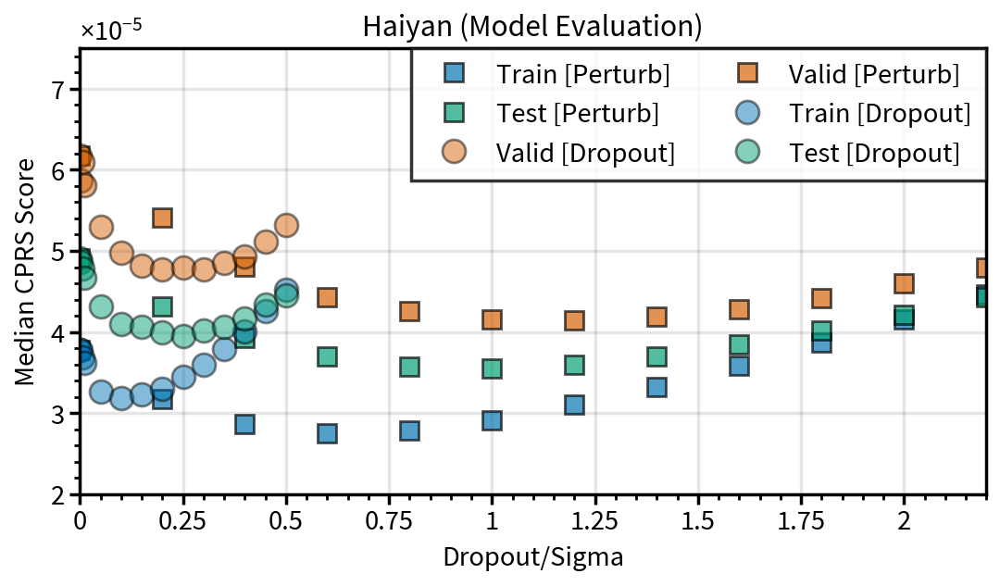

In [50]:
fig,axs = plot.subplots(ncols=1,nrows=1,axwidth=4.895,refaspect=2.031)
axs[0].plot(sigmas,[np.nanmedian(read_and_proc.flatten(storesigma_crps[obj]['train'])) for obj in sigmas],lw=0,label='Train [Perturb]',marker='s',mfc='C0',mew=1,mec='k',markersize=6.9,alpha=0.68)
axs[0].plot(sigmas,[np.nanmedian(read_and_proc.flatten(storesigma_crps[obj]['val'])) for obj in sigmas],lw=0,label='Valid [Perturb]',marker='s',mfc='C1',mew=1,mec='k',markersize=6.9,alpha=0.68)
axs[0].plot(sigmas,[np.nanmedian(read_and_proc.flatten(storesigma_crps[obj]['test'])) for obj in sigmas],lw=0,label='Test [Perturb]',marker='s',mfc='C2',mew=1,mec='k',markersize=6.9,alpha=0.68)

axs[0].plot(droprates,[np.nanmedian(read_and_proc.flatten([obj[i]['r2trains'] for i in range(40)])) for obj in crps_performance],lw=0,label='Train [Dropout]',marker='o',mfc='C0',mew=1,mec='k',markersize=9,alpha=0.48)
axs[0].plot(droprates,[np.nanmedian(read_and_proc.flatten([obj[i]['r2vals'] for i in range(40)])) for obj in crps_performance],lw=0,label='Valid [Dropout]',marker='o',mfc='C1',mew=1,mec='k',markersize=9,alpha=0.48)
axs[0].plot(droprates,[np.nanmedian(read_and_proc.flatten([obj[i]['r2tests'] for i in range(40)])) for obj in crps_performance],lw=0,label='Test [Dropout]',marker='o',mfc='C2',mew=1,mec='k',markersize=9,alpha=0.48)
#axs[0].plot(0,np.nanmedian(read_and_proc.flatten(storesigma_crps[0]['train'])),marker='s',mfc='C0',mew=1,mec='k',markersize=9,alpha=0.8)
#axs[0].plot(0,np.nanmedian(read_and_proc.flatten(storesigma_crps[0]['val'])),marker='s',mfc='C1',mew=1,mec='k',markersize=9,alpha=0.8)
#axs[0].plot(0,np.nanmedian(read_and_proc.flatten(storesigma_crps[0]['test'])),marker='s',mfc='C2',mew=1,mec='k',markersize=9,alpha=0.8)
axs.legend(loc=1,ncols=2)
axs.format(xlabel='Dropout/Sigma',ylabel='Median CPRS Score',title='Haiyan (Model Evaluation)',ylim=[2e-5,7.5e-5])#,xlim=[-0.01,0.525])
#plt.savefig('../analysis/pic/climateinfo/CPRSmedian_revised_twomethods.png',dpi=600)
plt.show()

In [59]:
np.asarray([np.min(obj) for obj in storesigma_crps[1]['val']]).argmin()

26

In [61]:
np.asarray(storesigma_crps[1]['val'][26]).argmin()

2

In [266]:
valsplit_pert = 26
modelnum_pert = 2
bestmodel_pert = r2_performance[0][int(valsplit_pert)]['models'][int(modelnum_pert)][0]
fl_pert = new_structure(store_notensor[valsplit_pert]['train'][0],bestmodel_pert,'LW')
flsw_pert = new_structure(store_notensor[valsplit_pert]['train'][0],bestmodel_pert,'SW')
flas_pert = np.squeeze(np.dot(fl_pert,pcalw['lw'].components_[:20,:])).reshape(10,360,208)
flas_sw_pert = np.squeeze(np.dot(flsw_pert,pcasw['sw'].components_[:20,:])).reshape(10,360,208)

In [305]:
testtt = np.squeeze(np.dot(new_structure(((storeallsigma[0.2]['allpred_inputs'][26][2])[10])[0],bestmodel_pert,'LW'),pcalw['lw'].components_[:20,:])).reshape(10,360,208)

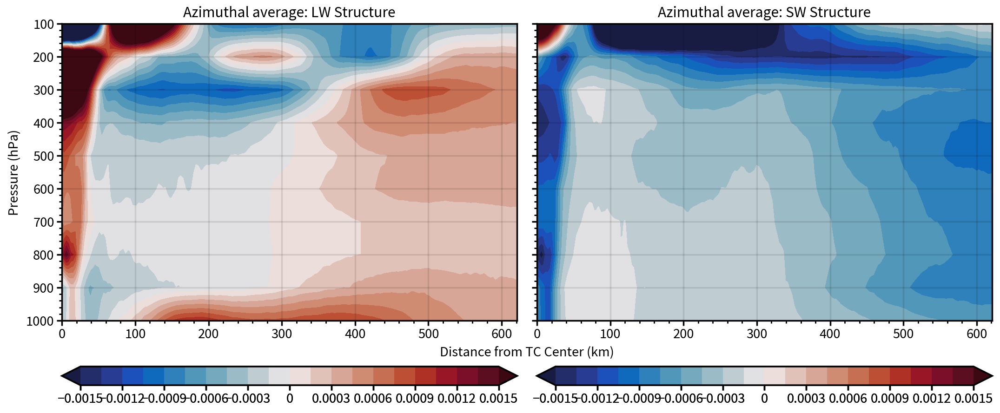

In [267]:
fig,axs = plot.subplots(ncols=2,nrows=1,axwidth=4.895,refaspect=1.531)
img = axs[0].contourf(np.linspace(0,207,208)*3,np.linspace(1000,100,10),np.mean(flas_pert,axis=1),cmap='balance',levels=np.linspace(-1.5e-3,1.5e-3,21),extend='both')#vmin=-0.5e-5,vmax=0.5e-5)
axs[0].colorbar(img,loc='b')
axs[0].format(xlabel='Distance from TC Center (km)',ylabel='Pressure (hPa)',title='Azimuthal average: LW Structure')
img2 = axs[1].contourf(np.linspace(0,207,208)*3,np.linspace(1000,100,10),np.mean(flas_sw_pert,axis=1),cmap='balance',levels=np.linspace(-1.5e-3,1.5e-3,21),extend='both')
axs[1].colorbar(img2,loc='b')
axs[1].format(xlabel='Distance from TC Center (km)',ylabel='Pressure (hPa)',title='Azimuthal average: SW Structure')
plt.show()

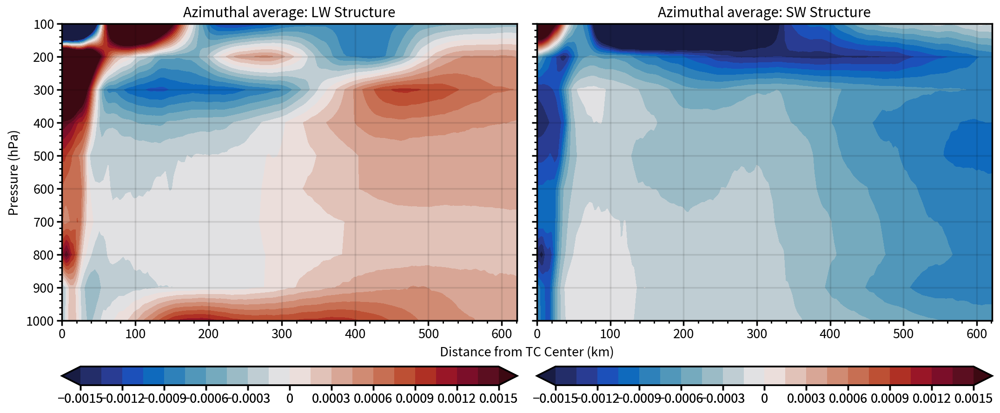

In [306]:
fig,axs = plot.subplots(ncols=2,nrows=1,axwidth=4.895,refaspect=1.531)
img = axs[0].contourf(np.linspace(0,207,208)*3,np.linspace(1000,100,10),np.mean(testtt,axis=1),cmap='balance',levels=np.linspace(-1.5e-3,1.5e-3,21),extend='both')#vmin=-0.5e-5,vmax=0.5e-5)
axs[0].colorbar(img,loc='b')
axs[0].format(xlabel='Distance from TC Center (km)',ylabel='Pressure (hPa)',title='Azimuthal average: LW Structure')
img2 = axs[1].contourf(np.linspace(0,207,208)*3,np.linspace(1000,100,10),np.mean(flas_sw_pert,axis=1),cmap='balance',levels=np.linspace(-1.5e-3,1.5e-3,21),extend='both')
axs[1].colorbar(img2,loc='b')
axs[1].format(xlabel='Distance from TC Center (km)',ylabel='Pressure (hPa)',title='Azimuthal average: SW Structure')
plt.show()

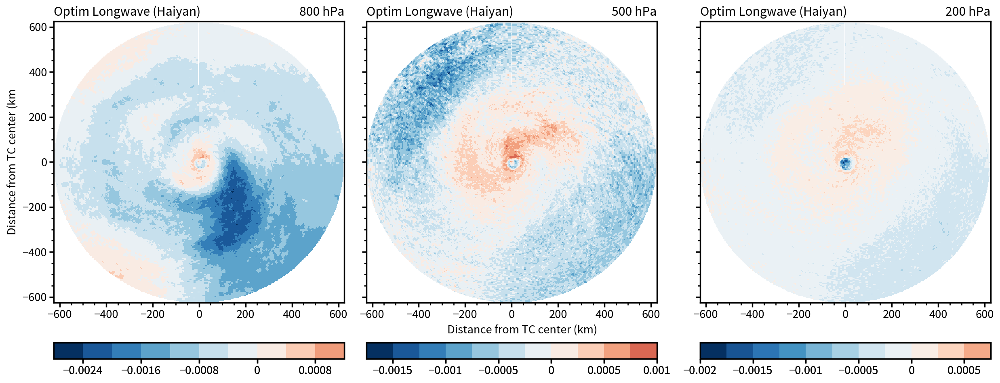

In [269]:
ANGLE = read_and_proc.azimuth2angle(np.linspace(0,359,360))
pressurelevel = [800,500,200]

fig,axs = plot.subplots(ncols=3,nrows=1,axwidth=3.595,refaspect=1.031)
for i,obj in enumerate([2,5,-2]):
    #maps = axs[i].pcolormesh(np.ma.masked_inside(normalize(np.fliplr(np.flipud(read_and_proc.proc_tocart(optimLW[int(obj),...],ANGLE,True,False)))),-.65,.65),cmap='BuRd',vmin=-3,vmax=3)
    apl = -(np.fliplr(np.flipud(read_and_proc.proc_tocart(np.asarray(flas_pert)[i,...],ANGLE,True,False))))
    values = -(np.fliplr(np.flipud(read_and_proc.proc_tocart(np.asarray(flas_pert)[i,...],ANGLE,True,False))))[0,0]
    maps = axs[i].pcolormesh(np.linspace(-208,208,416)*3, np.linspace(-208,208,416)*3, np.ma.masked_where(apl==values,apl),cmap='BuRd')
    # hatches
    #stdd = np.nanstd(np.abs(np.asarray(test_toavg)[:,5,int(obj),...]))#,45)
    #aaaa = np.ma.masked_inside((np.fliplr(np.flipud(read_and_proc.proc_tocart(np.nanmean(np.asarray(test_toavg),axis=0)[5,int(obj),...],ANGLE,True,False)))),-stdd,stdd).mask
    #axs[i].contourf(aaaa.astype(int),levels=[0,0.5,1],hatches=["////","",""],alpha=0)
    # format
    axs[i].format(ltitle='Optim Longwave (Haiyan)',xlabel='Distance from TC center (km)', ylabel='Distance from TC center (km',rtitle=f'{pressurelevel[i]} hPa')
    axs[i].colorbar(maps,loc='b')
#plt.savefig('../analysis/pic/climateinfo/MCdropout_optimLW_mean_base.png',dpi=600)
plt.show()

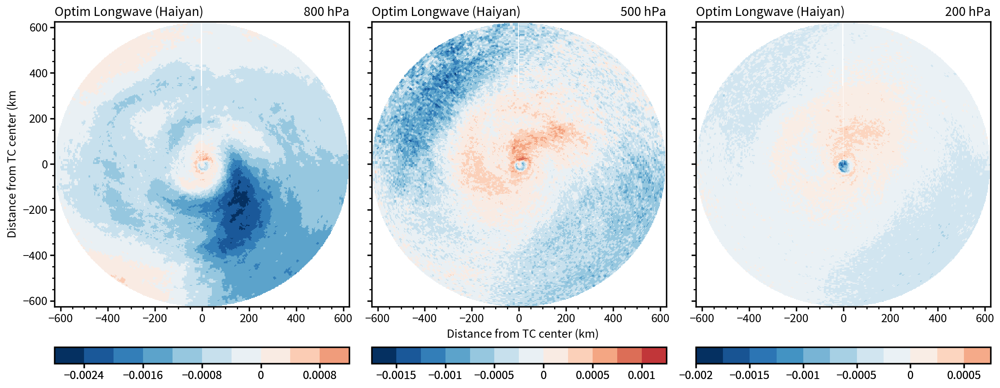

In [307]:
ANGLE = read_and_proc.azimuth2angle(np.linspace(0,359,360))
pressurelevel = [800,500,200]

fig,axs = plot.subplots(ncols=3,nrows=1,axwidth=3.595,refaspect=1.031)
for i,obj in enumerate([2,5,-2]):
    #maps = axs[i].pcolormesh(np.ma.masked_inside(normalize(np.fliplr(np.flipud(read_and_proc.proc_tocart(optimLW[int(obj),...],ANGLE,True,False)))),-.65,.65),cmap='BuRd',vmin=-3,vmax=3)
    apl = -(np.fliplr(np.flipud(read_and_proc.proc_tocart(np.asarray(testtt)[i,...],ANGLE,True,False))))
    values = -(np.fliplr(np.flipud(read_and_proc.proc_tocart(np.asarray(testtt)[i,...],ANGLE,True,False))))[0,0]
    maps = axs[i].pcolormesh(np.linspace(-208,208,416)*3, np.linspace(-208,208,416)*3, np.ma.masked_where(apl==values,apl),cmap='BuRd')
    # hatches
    #stdd = np.nanstd(np.abs(np.asarray(test_toavg)[:,5,int(obj),...]))#,45)
    #aaaa = np.ma.masked_inside((np.fliplr(np.flipud(read_and_proc.proc_tocart(np.nanmean(np.asarray(test_toavg),axis=0)[5,int(obj),...],ANGLE,True,False)))),-stdd,stdd).mask
    #axs[i].contourf(aaaa.astype(int),levels=[0,0.5,1],hatches=["////","",""],alpha=0)
    # format
    axs[i].format(ltitle='Optim Longwave (Haiyan)',xlabel='Distance from TC center (km)', ylabel='Distance from TC center (km',rtitle=f'{pressurelevel[i]} hPa')
    axs[i].colorbar(maps,loc='b')
#plt.savefig('../analysis/pic/climateinfo/MCdropout_optimLW_mean_base.png',dpi=600)
plt.show()

In [276]:
(storeallsigma[1]['allpred'][valsplit_pert][modelnum_pert])[0]['train'].shape

(926,)

# Validation

In [71]:
LW,SW = (np.asarray(store_notensor[valsplit]['train'][0])[:,-40:-20]),(np.asarray(store_notensor[valsplit]['train'][0])[:,-20:])
a2lw = benchmark.model_outweights_all(bestmodel)[0][-2][0].detach().numpy()[0]
a2sw = benchmark.model_outweights_all(bestmodel)[0][-2][0].detach().numpy()[1]
sumss_lw = np.sqrt(np.sum((benchmark.model_outweights_all(bestmodel)[0][0][0].detach().numpy()/np.std(LW,axis=0))**2))
sumss_sw = np.sqrt(np.sum((benchmark.model_outweights_all(bestmodel)[0][2][0].detach().numpy()/np.std(SW,axis=0))**2))
a_lw = np.abs(a2lw)*sumss_lw
a_sw = np.abs(a2sw)*sumss_sw
#benchmark.model_outweights_all(bestmodel_pert)[0][-1][0].detach().numpy()

In [72]:
b2 = benchmark.model_outweights_all(bestmodel)[0][-1][0].detach().numpy()
a1lw = benchmark.model_outweights_all(bestmodel)[0][0][0].detach().numpy()
b1lw = benchmark.model_outweights_all(bestmodel)[0][1][0].detach().numpy()
a1sw = benchmark.model_outweights_all(bestmodel)[0][2][0].detach().numpy()
b1sw = benchmark.model_outweights_all(bestmodel)[0][3][0].detach().numpy()

In [73]:
lw_tosum,sw_tosum = [],[]
for i in range(20):
    lw_tosum.append(a1lw[i]*np.mean(LW[:,i])/np.std(LW[:,i]))
    sw_tosum.append(a1sw[i]*np.mean(SW[:,i])/np.std(SW[:,i]))
LW_sum = np.sum(np.asarray(lw_tosum))
SW_sum = np.sum(np.asarray(sw_tosum))

In [74]:
b = b2 + a2lw * (b1lw - LW_sum) + a2sw * (b1sw - SW_sum)

In [75]:
b

0.0001526856815260436

In [76]:
#aaaa,bbbb = benchmark.model_outweights_all(bestmodel_pert)[0][-2][0].detach().numpy()[0],benchmark.model_outweights_all(bestmodel_pert)[0][-2][0].detach().numpy()[1]
predssss = a_lw*np.dot(np.asarray([obj[-40:-20] for obj in (store_notensor[valsplit]['train'][0])]),fl)+\
a_sw*np.dot(np.asarray([obj[-20:] for obj in (store_notensor[valsplit]['train'][0])]),flsw)+ b

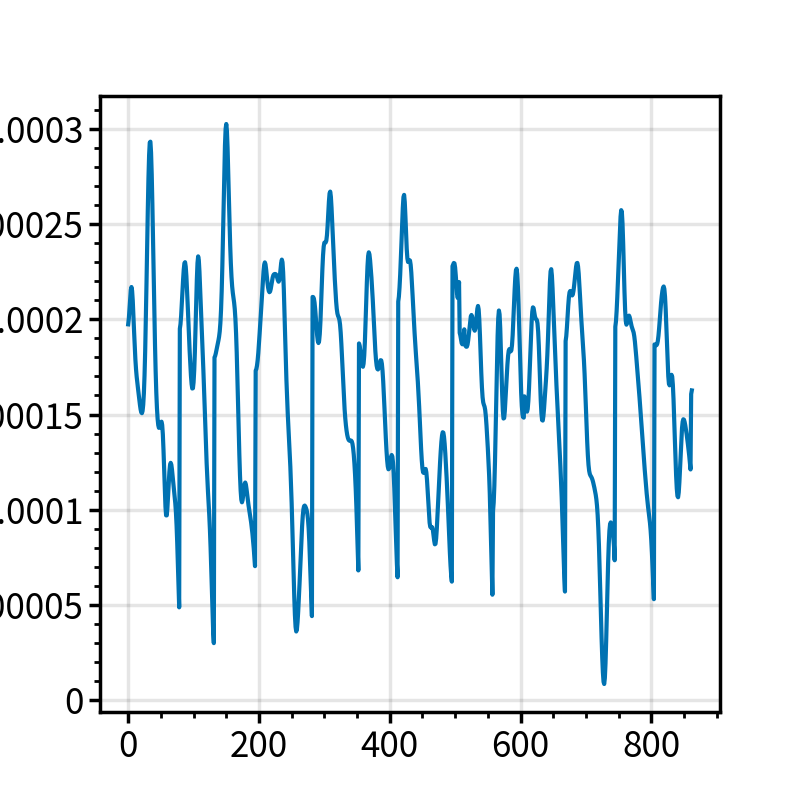

In [77]:
plt.plot(predssss)
#plt.xlim(0,50)
plt.show()

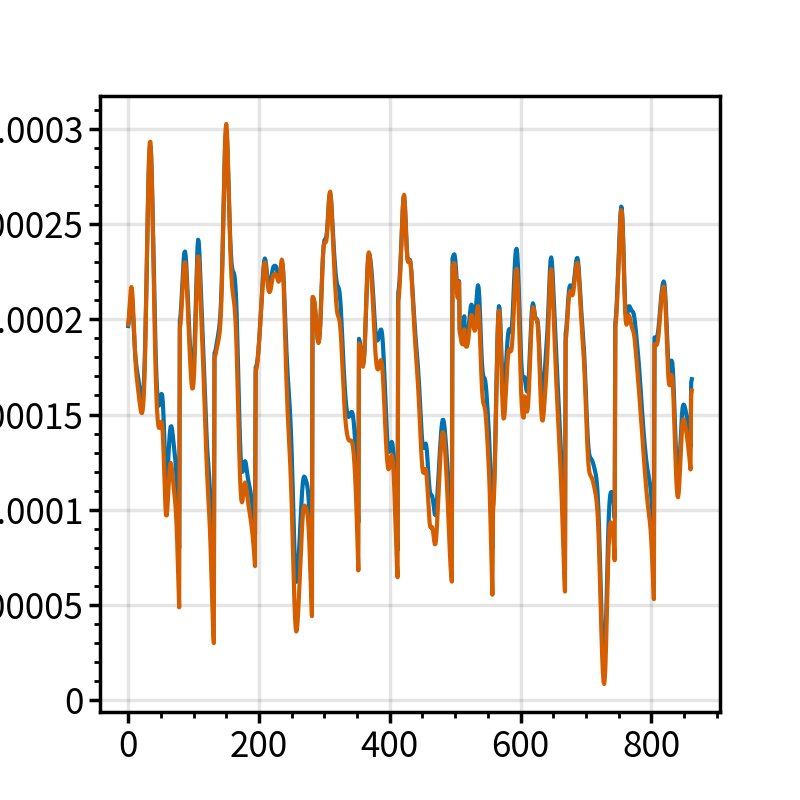

In [79]:
plt.plot(bestmodel.eval()(torch.FloatTensor(store_notensor[valsplit]['train'][0]).to('cpu')).detach().numpy().transpose()[0])
plt.plot(predssss)
#plt.xlim(0,50)
plt.show()
#plt.show()

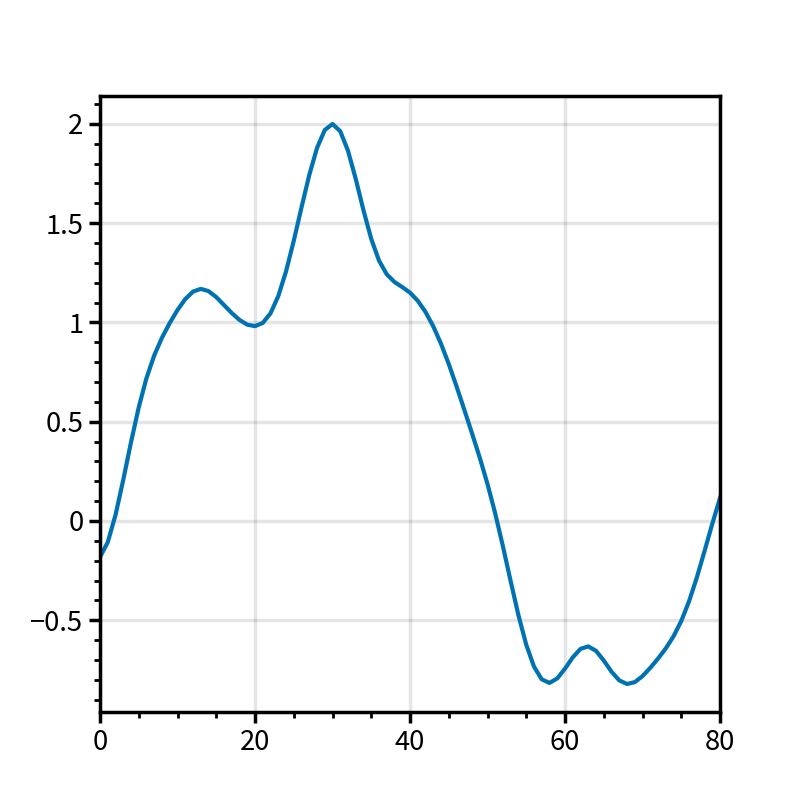

In [119]:
plt.plot(np.dot(np.asarray([obj[-40:-20] for obj in (store_notensor[valsplit_pert]['test'][0])]),fl_pert))
plt.xlim(0,80)
plt.show()